# ANALISIS EXPLORATORIO DE DATOS

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
import folium
import geopandas as gpd
from folium.plugins import HeatMap
from folium.plugins import MarkerCluster 




In [3]:
# Importar archivo para trabajar
df = pd.read_csv('/Users/benjaminzelaya/Desktop/PGF/PG/Sitios_Unidos.csv')

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3025011 entries, 0 to 3025010
Data columns (total 16 columns):
 #   Column            Dtype  
---  ------            -----  
 0   Unnamed: 0        int64  
 1   name              object 
 2   address           object 
 3   gmap_id           object 
 4   description       object 
 5   latitude          float64
 6   longitude         float64
 7   category          object 
 8   avg_rating        float64
 9   num_of_reviews    int64  
 10  price             object 
 11  hours             object 
 12  MISC              object 
 13  state             object 
 14  relative_results  object 
 15  url               object 
dtypes: float64(3), int64(2), object(11)
memory usage: 369.3+ MB


In [5]:
df.columns

Index(['Unnamed: 0', 'name', 'address', 'gmap_id', 'description', 'latitude',
       'longitude', 'category', 'avg_rating', 'num_of_reviews', 'price',
       'hours', 'MISC', 'state', 'relative_results', 'url'],
      dtype='object')

In [6]:
# Calcula el porcentaje de valores faltantes en cada columna
missing_percentage = df.isnull().mean() * 100

# Filtra las columnas que tienen valores faltantes
columns_with_missing_values = missing_percentage[missing_percentage > 0]

# Muestra el porcentaje de valores faltantes en cada columna
print("Porcentaje de valores faltantes por columna:")
print(columns_with_missing_values)

Porcentaje de valores faltantes por columna:
name                 0.001653
address              2.661511
description         91.593783
category             0.575833
price               90.902413
hours               26.029823
MISC                22.837405
state               24.676109
relative_results     9.753948
dtype: float64


In [7]:
pd.set_option('display.max_columns', None)  # Mostrar todas las columnas
df.head(5)

,Unnamed: 0,name,address,gmap_id,description,latitude,longitude,category,avg_rating,num_of_reviews,price,hours,MISC,state,relative_results,url
0,0,Porter Pharmacy,"Porter Pharmacy, 129 N Second St, Cochran, GA ...",0x88f16e41928ff687:0x883dad4fd048e8f8,NaN,32.388300,-83.357100,['Pharmacy'],4.9,16,NaN,"[['Friday', '8AM–6PM'], ['Saturday', '8AM–12PM...","{'Service options': ['In-store shopping', 'Sam...",Open ⋅ Closes 6PM,"['0x88f16e41929435cf:0x5b2532a2885e9ef6', '0x8...",https://www.google.com/maps/place//data=!4m2!3...
1,1,City Textile,"City Textile, 3001 E Pico Blvd, Los Angeles, C...",0x80c2c98c0e3c16fd:0x29ec8a728764fdf9,NaN,34.018891,-118.215290,['Textile exporter'],4.5,6,NaN,NaN,NaN,Open now,"['0x80c2c624136ea88b:0xb0315367ed448771', '0x8...",https://www.google.com/maps/place//data=!4m2!3...
2,2,San Soo Dang,"San Soo Dang, 761 S Vermont Ave, Los Angeles, ...",0x80c2c778e3b73d33:0xbdc58662a4a97d49,NaN,34.058092,-118.292130,['Korean restaurant'],4.4,18,NaN,"[['Thursday', '6:30AM–6PM'], ['Friday', '6:30A...","{'Service options': ['Takeout', 'Dine-in', 'De...",Open ⋅ Closes 6PM,"['0x80c2c78249aba68f:0x35bf16ce61be751d', '0x8...",https://www.google.com/maps/place//data=!4m2!3...
3,3,Nova Fabrics,"Nova Fabrics, 2200 E 11th St, Los Angeles, CA ...",0x80c2c89923b27a41:0x32041559418d447,NaN,34.023669,-118.232930,['Fabric store'],3.3,6,NaN,"[['Thursday', '9AM–5PM'], ['Friday', '9AM–5PM'...","{'Service options': ['In-store shopping'], 'Pa...",Open ⋅ Closes 5PM,"['0x80c2c8811477253f:0x23a8a492df1918f7', '0x8...",https://www.google.com/maps/place//data=!4m2!3...
4,4,Nobel Textile Co,"Nobel Textile Co, 719 E 9th St, Los Angeles, C...",0x80c2c632f933b073:0xc31785961fe826a6,NaN,34.036694,-118.249421,['Fabric store'],4.3,7,NaN,"[['Thursday', '9AM–5PM'], ['Friday', '9AM–5PM'...",{'Service options': ['In-store pickup']},Open ⋅ Closes 5PM,"['0x80c2c62c496083d1:0xdefa11317fe870a1', '0x8...",https://www.google.com/maps/place//data=!4m2!3...


In [8]:
df.dtypes

Unnamed: 0            int64
name                 object
address              object
gmap_id              object
description          object
latitude            float64
longitude           float64
category             object
avg_rating          float64
num_of_reviews        int64
price                object
hours                object
MISC                 object
state                object
relative_results     object
url                  object
dtype: object

In [10]:
df_union = pd.read_csv('/Users/benjaminzelaya/Desktop/PGF/PG/Union.csv')

In [11]:
df_union.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3025011 entries, 0 to 3025010
Data columns (total 6 columns):
 #   Column      Dtype  
---  ------      -----  
 0   Unnamed: 0  int64  
 1   category    object 
 2   avg_rating  float64
 3   gmap_id     object 
 4   name        object 
 5   Estado      object 
dtypes: float64(1), int64(1), object(4)
memory usage: 138.5+ MB


In [12]:
df_union.columns

Index(['Unnamed: 0', 'category', 'avg_rating', 'gmap_id', 'name', 'Estado'], dtype='object')

In [13]:
# Calcula el porcentaje de valores faltantes en cada columna
missing_percentage_df_union = df_union.isnull().mean() * 100

# Filtra las columnas que tienen valores faltantes
columns_with_missing_values_df_union = missing_percentage_df_union[missing_percentage_df_union > 0]

# Muestra el porcentaje de valores faltantes en cada columna
print("Porcentaje de valores faltantes por columna:")
print(columns_with_missing_values_df_union)

Porcentaje de valores faltantes por columna:
category     0.575833
name         0.002215
Estado      64.145453
dtype: float64


In [14]:
pd.set_option('display.max_columns', None)  # Mostrar todas las columnas
df_union.head(5)

,Unnamed: 0,category,avg_rating,gmap_id,name,Estado
0,0,['Pharmacy'],4.9,0x88f16e41928ff687:0x883dad4fd048e8f8,Porter Pharmacy,Georgia
1,1,['Textile exporter'],4.5,0x80c2c98c0e3c16fd:0x29ec8a728764fdf9,City Textile,NaN
2,2,['Korean restaurant'],4.4,0x80c2c778e3b73d33:0xbdc58662a4a97d49,San Soo Dang,California
3,3,['Fabric store'],3.3,0x80c2c89923b27a41:0x32041559418d447,Nova Fabrics,NaN
4,4,['Fabric store'],4.3,0x80c2c632f933b073:0xc31785961fe826a6,Nobel Textile Co,California


# ANALIZAMOS EL ESTADO DE CALIFORNIA CON EL DATAFRAME DF_UNION

In [15]:
california_df = df_union[df_union['Estado'] == 'California']

california_df

,Unnamed: 0,category,avg_rating,gmap_id,name,Estado
2,2,['Korean restaurant'],4.4,0x80c2c778e3b73d33:0xbdc58662a4a97d49,San Soo Dang,California
4,4,['Fabric store'],4.3,0x80c2c632f933b073:0xc31785961fe826a6,Nobel Textile Co,California
5,5,['Fabric store'],3.5,0x80c2cf163db6bc89:0x219484e2edbcfa41,Matrix International Textiles,California
6,6,['Restaurant'],4.5,0x80dd2b4c8555edb7:0xfc33d65c4bdbef42,Vons Chicken,California
13,13,"['Ski rental service', 'Snowboard rental servi...",5.0,0x80960c29f2e3bf29:0x4b291f0d275a5699,Black Tie Ski Rental Delivery of Mammoth,California
...,...,...,...,...,...,...
2084748,2084748,['Auto body shop'],4.7,0x808e3316dbc5c029:0xde142c328365e55f,Koss Collision Center,California
2084768,2084768,"['Massage therapist', 'Metaphysical supply sto...",4.9,0x54cde727ede36d0b:0x3d69616c4b1fa77b,Sacred Seed Crystals & Healing,California
2084769,2084769,"['Recycling center', 'Electronics store']",4.5,0x80c2c6669cf8ceaf:0xbcad67ba8ebfc8aa,Homeboy Electronics Recycling,California
2084962,2084962,"['Tennis store', 'Sporting goods store', 'Store']",4.7,0x808fbb2516173e1f:0x7cffe4df921d6774,Tennis Town & Country,California


In [16]:
california_df['category'].unique

<bound method Series.unique of 2                                      ['Korean restaurant']
4                                           ['Fabric store']
5                                           ['Fabric store']
6                                             ['Restaurant']
13         ['Ski rental service', 'Snowboard rental servi...
                                 ...                        
2084748                                   ['Auto body shop']
2084768    ['Massage therapist', 'Metaphysical supply sto...
2084769            ['Recycling center', 'Electronics store']
2084962    ['Tennis store', 'Sporting goods store', 'Store']
2084965                       ['Park', 'Tourist attraction']
Name: category, Length: 74620, dtype: object>

In [17]:
california_restaurant_df = california_df[(california_df['Estado'] == 'California') & (california_df['category'].str.contains('restaurant'))]

# Mostrar el DataFrame resultante
california_restaurant_df

,Unnamed: 0,category,avg_rating,gmap_id,name,Estado
2,2,['Korean restaurant'],4.4,0x80c2c778e3b73d33:0xbdc58662a4a97d49,San Soo Dang,California
1548,1548,"['Hamburger restaurant', 'American restaurant'...",3.7,0x80c2d765f8c90a3d:0x16afb75943e7ad50,Cowboy Burgers & BBQ,California
2237,2237,"['Cafe', 'Breakfast restaurant', 'Hamburger re...",4.6,0x54d15b5c2681df95:0xa611357b2e497e58,Beau Pre Cafe,California
2750,2750,"['Chinese restaurant', 'Asian fusion restauran...",4.8,0x80dc736926023cb9:0xb3377acd90a46f16,Chin's Szechwan - Carlsbad,California
3676,3676,"['Mexican restaurant', 'Restaurant']",3.4,0x808f7fd770b93dfd:0x9163bc5a8883c63b,Mijita,California
...,...,...,...,...,...,...
2084263,2084263,"['Coffee shop', 'Breakfast restaurant', 'Cafe'...",4.2,0x808e35adfb4ad331:0x8ff446481d2b9c3a,Starbucks,California
2084614,2084614,"['American restaurant', 'Brunch restaurant', '...",4.4,0x80d953599657345f:0x326882d24ffa795e,Rustic Root,California
2084671,2084671,"['Fast food restaurant', 'Hamburger restaurant...",4.0,0x80c290cd5fcce25d:0x296bf3eca368d132,Wendy's,California
2084681,2084681,"['Chinese restaurant', 'Asian restaurant', 'Re...",3.9,0x80c2956b34fc26c1:0x2f3b0897def449d6,Panda Express,California


In [18]:
california_restaurant_df['category'] = california_restaurant_df['category'].apply(lambda x: x.strip("[]").replace("'", "").split(", ") if isinstance(x, str) else x)

# Utilizar explode() para separar las categorías en filas individuales
separated_df = california_restaurant_df.explode('category')

# Mostrar el nuevo DataFrame resultante
separated_df

/var/folders/9h/wktndydj5rg6pj7yfx6ws1gm0000gn/T/ipykernel_35065/540995809.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  california_restaurant_df['category'] = california_restaurant_df['category'].apply(lambda x: x.strip("[]").replace("'", "").split(", ") if isinstance(x, str) else x)


,Unnamed: 0,category,avg_rating,gmap_id,name,Estado
2,2,Korean restaurant,4.4,0x80c2c778e3b73d33:0xbdc58662a4a97d49,San Soo Dang,California
1548,1548,Hamburger restaurant,3.7,0x80c2d765f8c90a3d:0x16afb75943e7ad50,Cowboy Burgers & BBQ,California
1548,1548,American restaurant,3.7,0x80c2d765f8c90a3d:0x16afb75943e7ad50,Cowboy Burgers & BBQ,California
1548,1548,Barbecue restaurant,3.7,0x80c2d765f8c90a3d:0x16afb75943e7ad50,Cowboy Burgers & BBQ,California
1548,1548,Fast food restaurant,3.7,0x80c2d765f8c90a3d:0x16afb75943e7ad50,Cowboy Burgers & BBQ,California
...,...,...,...,...,...,...
2084671,2084671,Restaurant,4.0,0x80c290cd5fcce25d:0x296bf3eca368d132,Wendy's,California
2084681,2084681,Chinese restaurant,3.9,0x80c2956b34fc26c1:0x2f3b0897def449d6,Panda Express,California
2084681,2084681,Asian restaurant,3.9,0x80c2956b34fc26c1:0x2f3b0897def449d6,Panda Express,California
2084681,2084681,Restaurant,3.9,0x80c2956b34fc26c1:0x2f3b0897def449d6,Panda Express,California


In [22]:
# separated_df.drop(columns=['category_single'], inplace=True)

# # Mostrar el DataFrame resultante
# separated_df

In [19]:
unique_categories = separated_df['category'].unique()
unique_categories

array(['Korean restaurant', 'Hamburger restaurant', 'American restaurant',
       'Barbecue restaurant', 'Fast food restaurant',
       'Mexican restaurant', 'Sandwich shop', 'Cafe',
       'Breakfast restaurant', 'Lunch restaurant', 'Chinese restaurant',
       'Asian fusion restaurant', 'Chinese noodle restaurant',
       'Dumpling restaurant', 'Soup restaurant', 'Restaurant',
       'Asian restaurant', 'Health food restaurant', 'Rice restaurant',
       'Sushi restaurant', 'Japanese restaurant',
       'Southeast Asian restaurant', 'Coffee shop', 'Pizza restaurant',
       'Filipino restaurant', 'Steak house', 'Bar', 'Kosher restaurant',
       'Bakery', 'Bubble tea store', 'Caterer', 'Cupcake shop', 'Deli',
       'Italian restaurant', 'Sports bar', 'Latin American restaurant',
       'Takeout Restaurant', 'Diner', 'Californian restaurant',
       'Distillery', 'Vietnamese restaurant', 'Indian restaurant',
       'South Asian restaurant', 'Catering food and drink supplier',
       

In [20]:
# Filtrar las categorías que no son 'Restaurant', 'caterer' o 'catering'
separated_df = separated_df[(separated_df['category'] != 'Restaurant') & 
                            (separated_df['category'] != 'caterer') &
                            (separated_df['category'] != 'catering')]

# Mostrar el DataFrame resultante
separated_df

,Unnamed: 0,category,avg_rating,gmap_id,name,Estado
2,2,Korean restaurant,4.4,0x80c2c778e3b73d33:0xbdc58662a4a97d49,San Soo Dang,California
1548,1548,Hamburger restaurant,3.7,0x80c2d765f8c90a3d:0x16afb75943e7ad50,Cowboy Burgers & BBQ,California
1548,1548,American restaurant,3.7,0x80c2d765f8c90a3d:0x16afb75943e7ad50,Cowboy Burgers & BBQ,California
1548,1548,Barbecue restaurant,3.7,0x80c2d765f8c90a3d:0x16afb75943e7ad50,Cowboy Burgers & BBQ,California
1548,1548,Fast food restaurant,3.7,0x80c2d765f8c90a3d:0x16afb75943e7ad50,Cowboy Burgers & BBQ,California
...,...,...,...,...,...,...
2084671,2084671,Fast food restaurant,4.0,0x80c290cd5fcce25d:0x296bf3eca368d132,Wendy's,California
2084671,2084671,Hamburger restaurant,4.0,0x80c290cd5fcce25d:0x296bf3eca368d132,Wendy's,California
2084681,2084681,Chinese restaurant,3.9,0x80c2956b34fc26c1:0x2f3b0897def449d6,Panda Express,California
2084681,2084681,Asian restaurant,3.9,0x80c2956b34fc26c1:0x2f3b0897def449d6,Panda Express,California


In [21]:

# Calcular la cantidad de veces que aparece cada categoría
category_counts = separated_df['category'].value_counts()

# Encontrar la categoría con la mayor cantidad
most_common_category = category_counts.idxmax()

# Filtrar el DataFrame original en función de la categoría con la mayor cantidad
most_common_category_df = separated_df[separated_df['category'] == most_common_category]

# Mostrar el DataFrame resultante
most_common_category_df

,Unnamed: 0,category,avg_rating,gmap_id,name,Estado
1548,1548,Mexican restaurant,3.7,0x80c2d765f8c90a3d:0x16afb75943e7ad50,Cowboy Burgers & BBQ,California
3676,3676,Mexican restaurant,3.4,0x808f7fd770b93dfd:0x9163bc5a8883c63b,Mijita,California
10701,10701,Mexican restaurant,4.3,0x80c2c798ad41d859:0x8823cd86d2abd5b3,La Superior Panaderia,California
10804,10804,Mexican restaurant,4.0,0x80c2d4c17351e5d5:0x25ec6df3990c5322,Taco Shack,California
17547,17547,Mexican restaurant,4.7,0x808f8f37c1b6d241:0x1b3bd5046ff3ce84,Tacos Dos Primos,California
...,...,...,...,...,...,...
2082496,2082496,Mexican restaurant,3.9,0x80c2b82e593589a1:0x35602b6daadce0d7,Taco Bell,California
2082948,2082948,Mexican restaurant,3.9,0x8094f0177b53a48f:0x1ec8610b98aa661e,Alfonso's Carniceria y Taqueria,California
2082966,2082966,Mexican restaurant,4.6,0x809467e6d96b758f:0x6223b7df070e0610,DON SALSA'S TAQUERIA,California
2083396,2083396,Mexican restaurant,4.1,0x808fb670fb4cefb7:0xc6d63f9f0105d24a,Garcia's Taqueria,California


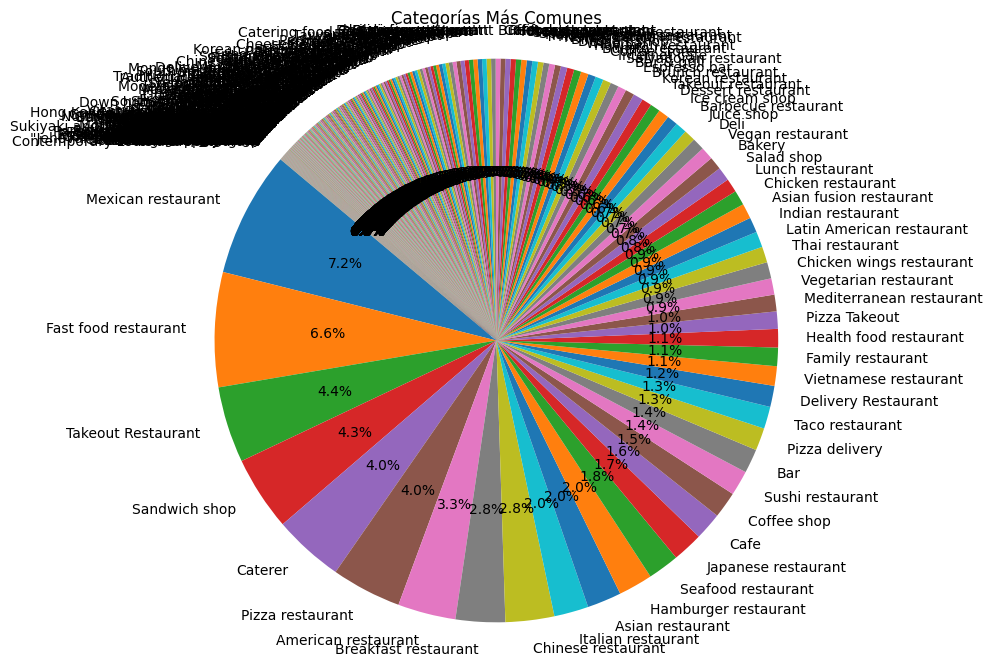

In [22]:
# Contar la cantidad de veces que aparece cada categoría
category_counts = separated_df['category'].value_counts()

# Crear un gráfico de pastel
plt.figure(figsize=(8, 8))
plt.pie(category_counts, labels=category_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Categorías Más Comunes')
plt.axis('equal')
plt.show()

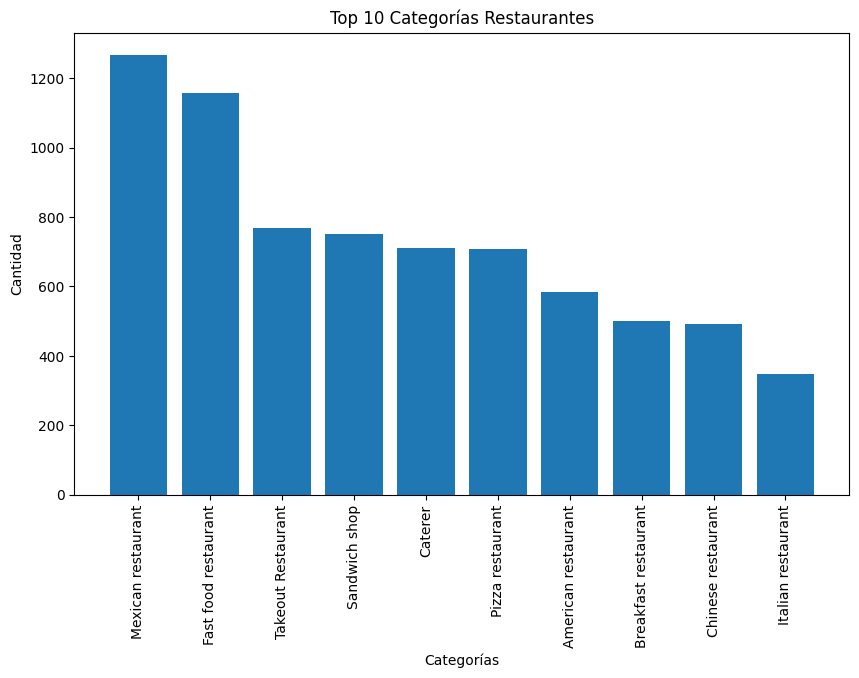

In [23]:

# Calcula el recuento de cada categoría
category_counts = separated_df['category'].value_counts()

# Define un umbral para determinar qué categorías son extremas o atípicas
umbral = 10  # Puedes ajustar este valor según tus criterios

# Filtra las categorías extremas o atípicas
extreme_categories = category_counts[(category_counts < umbral) | (category_counts > umbral)]

# Selecciona las primeras 10 categorías extremas o atípicas
top_10_extreme_categories = extreme_categories.head(10)

# Crea un nuevo DataFrame con las primeras 10 categorías extremas o atípicas y su recuento
top_10_extreme_categories_df = pd.DataFrame({'Category': top_10_extreme_categories.index, 'Count': top_10_extreme_categories.values})

# Grafica las primeras 10 categorías extremas o atípicas
plt.figure(figsize=(10, 6))
plt.bar(top_10_extreme_categories_df['Category'], top_10_extreme_categories_df['Count'])
plt.xlabel('Categorías')
plt.ylabel('Cantidad')
plt.title('Top 10 Categorías Restaurantes')
plt.xticks(rotation=90)  # Rotar las etiquetas del eje x para mayor legibilidad
plt.show()


# CATEGORIAS DE RESTAURANT DEL ESTADO DE CALIFORNIA EN ORDEN DESCENDENTE CONFORME CANTIDAD

In [24]:
# Calcular la cantidad de nombres repetidos en cada categoría
category_name_counts = separated_df.groupby('category')['name'].nunique()

# Crear un DataFrame con los resultados
category_name_counts_df = pd.DataFrame({'Category': category_name_counts.index, 'Unique Name Count': category_name_counts.values})

# Ordenar el DataFrame por la cantidad de nombres únicos de forma descendente
category_name_counts_df = category_name_counts_df.sort_values(by='Unique Name Count', ascending=False)

# Imprimir el DataFrame
category_name_counts_df

,Category,Unique Name Count
261,Mexican restaurant,1138
315,Pizza restaurant,452
83,Chinese restaurant,429
7,American restaurant,424
223,Japanese restaurant,293
...,...,...
164,Food products supplier,1
163,Food manufacturer,1
330,Recreation center,1
161,Food and drink,1


# CANTIDAD DE FRANQUICIAS EN ORDEN DESCENDENTE DEL ESTADO DE CALIFORNIA

In [25]:
# Calcular la cantidad de nombres repetidos en la columna 'name'
name_counts = separated_df['name'].value_counts()

# Crear un DataFrame con los resultados
name_counts_df = pd.DataFrame({'Name': name_counts.index, 'Count': name_counts.values})

# Filtrar solo los nombres que se repiten más de una vez
duplicate_names_df = name_counts_df[name_counts_df['Count'] > 1]

# Mostrar el DataFrame con los nombres repetidos
duplicate_names_df


,Name,Count
0,Subway,1563
1,Starbucks,450
2,Taco Bell,277
3,McDonald's,244
4,Pizza Hut,188
...,...,...
2538,Buddies Pizza,2
2539,Taco Bravo,2
2540,Sanad Freeze,2
2541,Wings & Stuff,2


# DATASET UNIFICADOS PARA ANALISIS EXPLORATORIO DE DATOS

In [26]:
df_parte1 = pd.read_csv('/Users/benjaminzelaya/Desktop/PGF/PG/PF_DS_REVIEWS_AND_RECOMMENDATIONS/Dataset/Union_modificado_parte1.csv')
df_parte1

,Unnamed: 0,gmap_id,Estado,category,avg_rating,name,latitude,longitude
0,0,0x8862134e67ff5c87:0x38b5e2ae99cd1fcf,Alabama,['Boutique'],4.6,Purple Peanut,34.713163,-86.574041
1,1,0x8862134e67ff5c87:0x38b5e2ae99cd1fcf,Alabama,['Boutique'],4.6,Purple Peanut,34.713163,-86.574041
2,2,0x886268e8fdc4fd2f:0x746533eb9aa4d4df,Alabama,"['Baby store', ""Children's furniture store""]",3.9,Posh Mommy & Baby Too!,34.753758,-86.739241
3,3,0x886268e8fdc4fd2f:0x746533eb9aa4d4df,Alabama,"['Baby store', ""Children's furniture store""]",3.9,Posh Mommy & Baby Too!,34.753758,-86.739241
4,4,0x8889aeaec69d4d49:0xb5c343f9d441acf2,Alabama,"['Movie rental kiosk', 'DVD store', 'Movie ren...",3.8,Redbox,33.852189,-86.816148
...,...,...,...,...,...,...,...,...
542297,542297,0x87c409ca2589df8b:0x82c20df73c071457,Missouri,['Restaurant'],4.3,Houndstooth Eatery,38.530549,-93.523913
542298,542298,0x87c0f5f63a4e58dd:0x8f9f3a985ea5a9ed,Missouri,"['Catholic church', 'Catholic school', 'Paroch...",4.9,"St. Therese Catholic Church, North",39.219497,-94.663501
542299,542299,0x87d8b69edb190479:0xc6fb0c7b55bea607,Missouri,['Locksmith'],4.4,Bates Street Lock & Safe,38.518368,-90.303621
542300,542300,0x87d8cacf5a8a3225:0x481f94b86a323319,Missouri,"['Plumber', 'Repair service']",4.7,Tony LaMartina Plumbing Company,38.624763,-90.283044


In [27]:
df_parte1.columns


Index(['Unnamed: 0', 'gmap_id', 'Estado', 'category', 'avg_rating', 'name',
       'latitude', 'longitude'],
      dtype='object')

In [28]:
# Elimino duplicates
df_parte1.drop_duplicates(subset='latitude', inplace=True)

# Verificar el DataFrame resultante
df_parte1

,Unnamed: 0,gmap_id,Estado,category,avg_rating,name,latitude,longitude
0,0,0x8862134e67ff5c87:0x38b5e2ae99cd1fcf,Alabama,['Boutique'],4.6,Purple Peanut,34.713163,-86.574041
2,2,0x886268e8fdc4fd2f:0x746533eb9aa4d4df,Alabama,"['Baby store', ""Children's furniture store""]",3.9,Posh Mommy & Baby Too!,34.753758,-86.739241
4,4,0x8889aeaec69d4d49:0xb5c343f9d441acf2,Alabama,"['Movie rental kiosk', 'DVD store', 'Movie ren...",3.8,Redbox,33.852189,-86.816148
6,6,0x88626b2e333be6d9:0x2a00a09a7045984f,Alabama,"['Flooring store', 'Carpet store', 'Rug store'...",4.2,James Carpets of Huntsville,34.760510,-86.587960
8,8,0x88890c0ff1fb3a1d:0x2b4463747ed6a8a,Alabama,['Social services organization'],4.4,John Williamson Boys & Girls Club,33.651683,-86.650421
...,...,...,...,...,...,...,...,...
542297,542297,0x87c409ca2589df8b:0x82c20df73c071457,Missouri,['Restaurant'],4.3,Houndstooth Eatery,38.530549,-93.523913
542298,542298,0x87c0f5f63a4e58dd:0x8f9f3a985ea5a9ed,Missouri,"['Catholic church', 'Catholic school', 'Paroch...",4.9,"St. Therese Catholic Church, North",39.219497,-94.663501
542299,542299,0x87d8b69edb190479:0xc6fb0c7b55bea607,Missouri,['Locksmith'],4.4,Bates Street Lock & Safe,38.518368,-90.303621
542300,542300,0x87d8cacf5a8a3225:0x481f94b86a323319,Missouri,"['Plumber', 'Repair service']",4.7,Tony LaMartina Plumbing Company,38.624763,-90.283044


In [29]:
df_parte2 = pd.read_csv('/Users/benjaminzelaya/Desktop/PGF/PG/PF_DS_REVIEWS_AND_RECOMMENDATIONS/Dataset/Union_modificado_parte2.csv')
df_parte2

,Unnamed: 0,gmap_id,Estado,category,avg_rating,name,latitude,longitude
0,542302,0x87d8cf352389e10d:0x11abff4cf57fb7a8,Missouri,['Eye care center'],4.8,Crown Vision Center,38.507013,-90.376491
1,542303,0x87cf64abdb2d4db9:0xea5d682e1fbec1c2,Missouri,"['Auto repair shop', 'Auto parts store', 'Brak...",3.4,Sears Auto Center,37.162154,-93.270335
2,542304,0x87ded19d3c06b209:0x92248013b84f5ee6,Missouri,['Nail salon'],4.5,VN Nails,38.769306,-90.700816
3,542305,0x87ded1196be078bf:0x8ab6871d9dbd234a,Missouri,['Car rental agency'],3.1,Budget Car Rental,38.768932,-90.700830
4,542306,0x87dedd5b733c996f:0x1ecd9093d6b8acd,Missouri,['Auto repair shop'],4.9,A G S Automotive Inc.,38.976870,-90.740756
...,...,...,...,...,...,...,...,...
542297,1084599,0x5490550bf74a2a4d:0xdffe9bd523a53f1e,Washington,['Church'],4.6,Fellowship Group,47.253810,-122.449407
542298,1084600,0x5491004195a77427:0x51bf13430c3ff249,Washington,['Used car dealer'],4.1,Goodfella's Motor Co,47.193101,-122.483197
542299,1084601,0x5491014d6fbcd7fd:0xe027823a9d0e4ecf,Washington,['Clothing store'],4.4,Thrift Center,47.155134,-122.438990
542300,1084602,0x54923990302cb3c7:0x10f023b56efdb019,Washington,"['Driver and vehicle licensing agency', 'Local...",4.3,Hoquiam Licensing & Transportation Agency,46.976293,-123.850030


In [30]:
df_parte1 = pd.read_csv('/Users/benjaminzelaya/Desktop/PGF/PG/PF_DS_REVIEWS_AND_RECOMMENDATIONS/Dataset/Union_modificado_parte1.csv')
df_parte2 = pd.read_csv('/Users/benjaminzelaya/Desktop/PGF/PG/PF_DS_REVIEWS_AND_RECOMMENDATIONS/Dataset/Union_modificado_parte2.csv')

# Unir los dos DataFrames
df_final = pd.concat([df_parte1, df_parte2], ignore_index=True)

# Verificar el DataFrame resultante
df_final 

,Unnamed: 0,gmap_id,Estado,category,avg_rating,name,latitude,longitude
0,0,0x8862134e67ff5c87:0x38b5e2ae99cd1fcf,Alabama,['Boutique'],4.6,Purple Peanut,34.713163,-86.574041
1,1,0x8862134e67ff5c87:0x38b5e2ae99cd1fcf,Alabama,['Boutique'],4.6,Purple Peanut,34.713163,-86.574041
2,2,0x886268e8fdc4fd2f:0x746533eb9aa4d4df,Alabama,"['Baby store', ""Children's furniture store""]",3.9,Posh Mommy & Baby Too!,34.753758,-86.739241
3,3,0x886268e8fdc4fd2f:0x746533eb9aa4d4df,Alabama,"['Baby store', ""Children's furniture store""]",3.9,Posh Mommy & Baby Too!,34.753758,-86.739241
4,4,0x8889aeaec69d4d49:0xb5c343f9d441acf2,Alabama,"['Movie rental kiosk', 'DVD store', 'Movie ren...",3.8,Redbox,33.852189,-86.816148
...,...,...,...,...,...,...,...,...
1084599,1084599,0x5490550bf74a2a4d:0xdffe9bd523a53f1e,Washington,['Church'],4.6,Fellowship Group,47.253810,-122.449407
1084600,1084600,0x5491004195a77427:0x51bf13430c3ff249,Washington,['Used car dealer'],4.1,Goodfella's Motor Co,47.193101,-122.483197
1084601,1084601,0x5491014d6fbcd7fd:0xe027823a9d0e4ecf,Washington,['Clothing store'],4.4,Thrift Center,47.155134,-122.438990
1084602,1084602,0x54923990302cb3c7:0x10f023b56efdb019,Washington,"['Driver and vehicle licensing agency', 'Local...",4.3,Hoquiam Licensing & Transportation Agency,46.976293,-123.850030


In [31]:
# Elimino duplicates
df_final.drop_duplicates(subset='latitude', inplace=True)

# Verificar el DataFrame resultante
df_final

,Unnamed: 0,gmap_id,Estado,category,avg_rating,name,latitude,longitude
0,0,0x8862134e67ff5c87:0x38b5e2ae99cd1fcf,Alabama,['Boutique'],4.6,Purple Peanut,34.713163,-86.574041
2,2,0x886268e8fdc4fd2f:0x746533eb9aa4d4df,Alabama,"['Baby store', ""Children's furniture store""]",3.9,Posh Mommy & Baby Too!,34.753758,-86.739241
4,4,0x8889aeaec69d4d49:0xb5c343f9d441acf2,Alabama,"['Movie rental kiosk', 'DVD store', 'Movie ren...",3.8,Redbox,33.852189,-86.816148
6,6,0x88626b2e333be6d9:0x2a00a09a7045984f,Alabama,"['Flooring store', 'Carpet store', 'Rug store'...",4.2,James Carpets of Huntsville,34.760510,-86.587960
8,8,0x88890c0ff1fb3a1d:0x2b4463747ed6a8a,Alabama,['Social services organization'],4.4,John Williamson Boys & Girls Club,33.651683,-86.650421
...,...,...,...,...,...,...,...,...
1084599,1084599,0x5490550bf74a2a4d:0xdffe9bd523a53f1e,Washington,['Church'],4.6,Fellowship Group,47.253810,-122.449407
1084600,1084600,0x5491004195a77427:0x51bf13430c3ff249,Washington,['Used car dealer'],4.1,Goodfella's Motor Co,47.193101,-122.483197
1084601,1084601,0x5491014d6fbcd7fd:0xe027823a9d0e4ecf,Washington,['Clothing store'],4.4,Thrift Center,47.155134,-122.438990
1084602,1084602,0x54923990302cb3c7:0x10f023b56efdb019,Washington,"['Driver and vehicle licensing agency', 'Local...",4.3,Hoquiam Licensing & Transportation Agency,46.976293,-123.850030


In [32]:
df_final['category'] = df_final['category'].apply(lambda x: x.strip("[]").replace("'", "").split(", ") if isinstance(x, str) else x)

# Utilizar explode() para separar las categorías en filas individuales
separated_df_final = df_final.explode('category')

# Mostrar el nuevo DataFrame resultante
separated_df_final

,Unnamed: 0,gmap_id,Estado,category,avg_rating,name,latitude,longitude
0,0,0x8862134e67ff5c87:0x38b5e2ae99cd1fcf,Alabama,Boutique,4.6,Purple Peanut,34.713163,-86.574041
2,2,0x886268e8fdc4fd2f:0x746533eb9aa4d4df,Alabama,Baby store,3.9,Posh Mommy & Baby Too!,34.753758,-86.739241
2,2,0x886268e8fdc4fd2f:0x746533eb9aa4d4df,Alabama,"""Childrens furniture store""",3.9,Posh Mommy & Baby Too!,34.753758,-86.739241
4,4,0x8889aeaec69d4d49:0xb5c343f9d441acf2,Alabama,Movie rental kiosk,3.8,Redbox,33.852189,-86.816148
4,4,0x8889aeaec69d4d49:0xb5c343f9d441acf2,Alabama,DVD store,3.8,Redbox,33.852189,-86.816148
...,...,...,...,...,...,...,...,...
1084600,1084600,0x5491004195a77427:0x51bf13430c3ff249,Washington,Used car dealer,4.1,Goodfella's Motor Co,47.193101,-122.483197
1084601,1084601,0x5491014d6fbcd7fd:0xe027823a9d0e4ecf,Washington,Clothing store,4.4,Thrift Center,47.155134,-122.438990
1084602,1084602,0x54923990302cb3c7:0x10f023b56efdb019,Washington,Driver and vehicle licensing agency,4.3,Hoquiam Licensing & Transportation Agency,46.976293,-123.850030
1084602,1084602,0x54923990302cb3c7:0x10f023b56efdb019,Washington,Local government office,4.3,Hoquiam Licensing & Transportation Agency,46.976293,-123.850030


In [33]:
df_poblacion = pd.read_csv('/Users/benjaminzelaya/Desktop/PGF/PG/PF_DS_REVIEWS_AND_RECOMMENDATIONS/Dataset/DataSet Population EEUU.csv')
df_poblacion

,Label (Grouping),SEX AND AGE,SEX AND AGE!!Total population,SEX AND AGE!!Total population!!Male,SEX AND AGE!!Total population!!Female,SEX AND AGE!!Total population!!Sex ratio (males per 100 females),SEX AND AGE!!Total population!!Under 5 years,SEX AND AGE!!Total population!!5 to 9 years,SEX AND AGE!!Total population!!10 to 14 years,SEX AND AGE!!Total population!!15 to 19 years,SEX AND AGE!!Total population!!20 to 24 years,SEX AND AGE!!Total population!!25 to 34 years,SEX AND AGE!!Total population!!35 to 44 years,SEX AND AGE!!Total population!!45 to 54 years,SEX AND AGE!!Total population!!55 to 59 years,SEX AND AGE!!Total population!!60 to 64 years,SEX AND AGE!!Total population!!65 to 74 years,SEX AND AGE!!Total population!!75 to 84 years,SEX AND AGE!!Total population!!85 years and over,SEX AND AGE!!Total population!!Median age (years),SEX AND AGE!!Total population!!Under 18 years,SEX AND AGE!!Total population!!16 years and over,SEX AND AGE!!Total population!!18 years and over,SEX AND AGE!!Total population!!21 years and over,SEX AND AGE!!Total population!!62 years and over,SEX AND AGE!!Total population!!65 years and over,SEX AND AGE!!Total population!!18 years and over.1,SEX AND AGE!!Total population!!18 years and over!!Male,SEX AND AGE!!Total population!!18 years and over!!Female,SEX AND AGE!!Total population!!18 years and over!!Sex ratio (males per 100 females),SEX AND AGE!!Total population!!65 years and over.1,SEX AND AGE!!Total population!!65 years and over!!Male,SEX AND AGE!!Total population!!65 years and over!!Female,SEX AND AGE!!Total population!!65 years and over!!Sex ratio (males per 100 females),RACE,RACE!!Total population,RACE!!Total population!!One race,RACE!!Total population!!Two or more races,RACE!!Total population!!One race.1,RACE!!Total population!!One race!!White,RACE!!Total population!!One race!!Black or African American,RACE!!Total population!!One race!!American Indian and Alaska Native,RACE!!Total population!!One race!!American Indian and Alaska Native!!Cherokee tribal grouping,RACE!!Total population!!One race!!American Indian and Alaska Native!!Chippewa tribal grouping,RACE!!Total population!!One race!!American Indian and Alaska Native!!Navajo tribal grouping,RACE!!Total population!!One race!!American Indian and Alaska Native!!Sioux tribal grouping,RACE!!Total population!!One race!!Asian,RACE!!Total population!!One race!!Asian!!Asian Indian,RACE!!Total population!!One race!!Asian!!Chinese,RACE!!Total population!!One race!!Asian!!Filipino,RACE!!Total population!!One race!!Asian!!Japanese,RACE!!Total population!!One race!!Asian!!Korean,RACE!!Total population!!One race!!Asian!!Vietnamese,RACE!!Total population!!One race!!Asian!!Other Asian,RACE!!Total population!!One race!!Native Hawaiian and Other Pacific Islander,RACE!!Total population!!One race!!Native Hawaiian and Other Pacific Islander!!Native Hawaiian,RACE!!Total population!!One race!!Native Hawaiian and Other Pacific Islander!!Chamorro,RACE!!Total population!!One race!!Native Hawaiian and Other Pacific Islander!!Samoan,RACE!!Total population!!One race!!Native Hawaiian and Other Pacific Islander!!Other Pacific Islander,RACE!!Total population!!One race!!Some other race,RACE!!Total population!!Two or more races.1,RACE!!Total population!!Two or more races!!White and Black or African American,RACE!!Total population!!Two or more races!!White and American Indian and Alaska Native,RACE!!Total population!!Two or more races!!White and Asian,RACE!!Total population!!Two or more races!!Black or African American and American Indian and Alaska Native,Race alone or in combination with one or more other races,Race alone or in combination with one or more other races!!Total population,Race alone or in combination with one or more other races!!Total population!!White,Race alone or in combination with one or more other races!!Total population!!Black or African American,Race alone or in combination with one or more other races!!Total population!!American Indian and Alaska N

In [34]:
print(df_poblacion.columns)

Index(['Label (Grouping)', 'SEX AND AGE', 'SEX AND AGE!!Total population',
       'SEX AND AGE!!Total population!!Male',
       'SEX AND AGE!!Total population!!Female',
       'SEX AND AGE!!Total population!!Sex ratio (males per 100 females)',
       'SEX AND AGE!!Total population!!Under 5 years',
       'SEX AND AGE!!Total population!!5 to 9 years',
       'SEX AND AGE!!Total population!!10 to 14 years',
       'SEX AND AGE!!Total population!!15 to 19 years',
       'SEX AND AGE!!Total population!!20 to 24 years',
       'SEX AND AGE!!Total population!!25 to 34 years',
       'SEX AND AGE!!Total population!!35 to 44 years',
       'SEX AND AGE!!Total population!!45 to 54 years',
       'SEX AND AGE!!Total population!!55 to 59 years',
       'SEX AND AGE!!Total population!!60 to 64 years',
       'SEX AND AGE!!Total population!!65 to 74 years',
       'SEX AND AGE!!Total population!!75 to 84 years',
       'SEX AND AGE!!Total population!!85 years and over',
       'SEX AND AGE!!Total p

In [35]:
df_poblacion

,Label (Grouping),SEX AND AGE,SEX AND AGE!!Total population,SEX AND AGE!!Total population!!Male,SEX AND AGE!!Total population!!Female,SEX AND AGE!!Total population!!Sex ratio (males per 100 females),SEX AND AGE!!Total population!!Under 5 years,SEX AND AGE!!Total population!!5 to 9 years,SEX AND AGE!!Total population!!10 to 14 years,SEX AND AGE!!Total population!!15 to 19 years,SEX AND AGE!!Total population!!20 to 24 years,SEX AND AGE!!Total population!!25 to 34 years,SEX AND AGE!!Total population!!35 to 44 years,SEX AND AGE!!Total population!!45 to 54 years,SEX AND AGE!!Total population!!55 to 59 years,SEX AND AGE!!Total population!!60 to 64 years,SEX AND AGE!!Total population!!65 to 74 years,SEX AND AGE!!Total population!!75 to 84 years,SEX AND AGE!!Total population!!85 years and over,SEX AND AGE!!Total population!!Median age (years),SEX AND AGE!!Total population!!Under 18 years,SEX AND AGE!!Total population!!16 years and over,SEX AND AGE!!Total population!!18 years and over,SEX AND AGE!!Total population!!21 years and over,SEX AND AGE!!Total population!!62 years and over,SEX AND AGE!!Total population!!65 years and over,SEX AND AGE!!Total population!!18 years and over.1,SEX AND AGE!!Total population!!18 years and over!!Male,SEX AND AGE!!Total population!!18 years and over!!Female,SEX AND AGE!!Total population!!18 years and over!!Sex ratio (males per 100 females),SEX AND AGE!!Total population!!65 years and over.1,SEX AND AGE!!Total population!!65 years and over!!Male,SEX AND AGE!!Total population!!65 years and over!!Female,SEX AND AGE!!Total population!!65 years and over!!Sex ratio (males per 100 females),RACE,RACE!!Total population,RACE!!Total population!!One race,RACE!!Total population!!Two or more races,RACE!!Total population!!One race.1,RACE!!Total population!!One race!!White,RACE!!Total population!!One race!!Black or African American,RACE!!Total population!!One race!!American Indian and Alaska Native,RACE!!Total population!!One race!!American Indian and Alaska Native!!Cherokee tribal grouping,RACE!!Total population!!One race!!American Indian and Alaska Native!!Chippewa tribal grouping,RACE!!Total population!!One race!!American Indian and Alaska Native!!Navajo tribal grouping,RACE!!Total population!!One race!!American Indian and Alaska Native!!Sioux tribal grouping,RACE!!Total population!!One race!!Asian,RACE!!Total population!!One race!!Asian!!Asian Indian,RACE!!Total population!!One race!!Asian!!Chinese,RACE!!Total population!!One race!!Asian!!Filipino,RACE!!Total population!!One race!!Asian!!Japanese,RACE!!Total population!!One race!!Asian!!Korean,RACE!!Total population!!One race!!Asian!!Vietnamese,RACE!!Total population!!One race!!Asian!!Other Asian,RACE!!Total population!!One race!!Native Hawaiian and Other Pacific Islander,RACE!!Total population!!One race!!Native Hawaiian and Other Pacific Islander!!Native Hawaiian,RACE!!Total population!!One race!!Native Hawaiian and Other Pacific Islander!!Chamorro,RACE!!Total population!!One race!!Native Hawaiian and Other Pacific Islander!!Samoan,RACE!!Total population!!One race!!Native Hawaiian and Other Pacific Islander!!Other Pacific Islander,RACE!!Total population!!One race!!Some other race,RACE!!Total population!!Two or more races.1,RACE!!Total population!!Two or more races!!White and Black or African American,RACE!!Total population!!Two or more races!!White and American Indian and Alaska Native,RACE!!Total population!!Two or more races!!White and Asian,RACE!!Total population!!Two or more races!!Black or African American and American Indian and Alaska Native,Race alone or in combination with one or more other races,Race alone or in combination with one or more other races!!Total population,Race alone or in combination with one or more other races!!Total population!!White,Race alone or in combination with one or more other races!!Total population!!Black or African American,Race alone or in combination with one or more other races!!Total population!!American Indian and Alaska N

In [36]:
df_poblacion = df_poblacion.drop(columns=['SEX AND AGE'])


In [37]:
nuevos_nombres = {col: col.replace("SEX AND AGE", "") for col in df_poblacion.columns}

# Renombra las columnas del DataFrame usando el diccionario
df_poblacion.rename(columns=nuevos_nombres, inplace=True)
nuevos_nombres = {col: col.replace("!!", " ") for col in df_poblacion.columns}

# Renombra las columnas del DataFrame usando el diccionario
df_poblacion.rename(columns=nuevos_nombres, inplace=True)

In [38]:
df_poblacion

,Label (Grouping),Total population,Total population Male,Total population Female,Total population Sex ratio (males per 100 females),Total population Under 5 years,Total population 5 to 9 years,Total population 10 to 14 years,Total population 15 to 19 years,Total population 20 to 24 years,Total population 25 to 34 years,Total population 35 to 44 years,Total population 45 to 54 years,Total population 55 to 59 years,Total population 60 to 64 years,Total population 65 to 74 years,Total population 75 to 84 years,Total population 85 years and over,Total population Median age (years),Total population Under 18 years,Total population 16 years and over,Total population 18 years and over,Total population 21 years and over,Total population 62 years and over,Total population 65 years and over,Total population 18 years and over.1,Total population 18 years and over Male,Total population 18 years and over Female,Total population 18 years and over Sex ratio (males per 100 females),Total population 65 years and over.1,Total population 65 years and over Male,Total population 65 years and over Female,Total population 65 years and over Sex ratio (males per 100 females),RACE,RACE Total population,RACE Total population One race,RACE Total population Two or more races,RACE Total population One race.1,RACE Total population One race White,RACE Total population One race Black or African American,RACE Total population One race American Indian and Alaska Native,RACE Total population One race American Indian and Alaska Native Cherokee tribal grouping,RACE Total population One race American Indian and Alaska Native Chippewa tribal grouping,RACE Total population One race American Indian and Alaska Native Navajo tribal grouping,RACE Total population One race American Indian and Alaska Native Sioux tribal grouping,RACE Total population One race Asian,RACE Total population One race Asian Asian Indian,RACE Total population One race Asian Chinese,RACE Total population One race Asian Filipino,RACE Total population One race Asian Japanese,RACE Total population One race Asian Korean,RACE Total population One race Asian Vietnamese,RACE Total population One race Asian Other Asian,RACE Total population One race Native Hawaiian and Other Pacific Islander,RACE Total population One race Native Hawaiian and Other Pacific Islander Native Hawaiian,RACE Total population One race Native Hawaiian and Other Pacific Islander Chamorro,RACE Total population One race Native Hawaiian and Other Pacific Islander Samoan,RACE Total population One race Native Hawaiian and Other Pacific Islander Other Pacific Islander,RACE Total population One race Some other race,RACE Total population Two or more races.1,RACE Total population Two or more races White and Black or African American,RACE Total population Two or more races White and American Indian and Alaska Native,RACE Total population Two or more races White and Asian,RACE Total population Two or more races Black or African American and American Indian and Alaska Native,Race alone or in combination with one or more other races,Race alone or in combination with one or more other races Total population,Race alone or in combination with one or more other races Total population White,Race alone or in combination with one or more other races Total population Black or African American,Race alone or in combination with one or more other races Total population American Indian and Alaska Native,Race alone or in combination with one or more other races Total population Asian,Race alone or in combination with one or more other races Total population Native Hawaiian and Other Pacific Islander,Race alone or in combination with one or more other races Total population Some other race,HISPANIC OR LATINO AND RACE,HISPANIC OR LATINO AND RACE Total population,HISPANIC OR LATINO AND RACE Total population Hispanic or Latino (of any race),HISPANIC OR LATINO AND RACE Total population Hispanic or Latino (of any race) Mexican,HISPANIC OR LATINO AND RACE Total popu

In [38]:
# Aquí seleccionamos todas las columnas hasta la 5ta.
nombres_columnas = df_poblacion.columns.tolist() 
df_poblacion = df_poblacion.drop(df_poblacion.columns[5:18], axis=1)


In [39]:
df_poblacion = df_poblacion.drop(df_poblacion.columns[10:], axis=1)

In [40]:
df_poblacion.iloc[:, 1:] = df_poblacion.iloc[:, 1:].apply(lambda x: x.shift(-1))
df_poblacion = df_poblacion.iloc[::3]
df_poblacion = df_poblacion.reset_index(drop=True)

In [41]:
df_poblacion

,Label (Grouping),Total population,Total population Male,Total population Female,Total population Sex ratio (males per 100 females),Total population Under 5 years,Total population 5 to 9 years,Total population 10 to 14 years,Total population 15 to 19 years,Total population 20 to 24 years
0,Alabama,"5,039,877","2,445,896","2,593,981",94.3,"290,091","298,540","337,730","338,347","323,961"
1,Alaska,"732,673","383,121","349,552",109.6,"46,198","52,071","52,507","50,263","45,855"
2,Arizona,"7,276,316","3,629,620","3,646,696",99.5,"402,255","446,309","476,245","482,998","488,212"
3,Arkansas,"3,025,891","1,493,681","1,532,210",97.5,"179,924","196,276","204,485","206,963","200,480"
4,California,"39,237,836","19,618,934","19,618,902",100.0,"2,210,235","2,358,988","2,647,372","2,579,680","2,531,692"
5,Colorado,"5,812,069","2,943,037","2,869,032",102.6,"307,837","336,492","374,046","375,792","373,720"
6,Connecticut,"3,605,597","1,768,045","1,837,552",96.2,"177,577","196,796","212,689","244,686","239,473"
7,Delaware,"1,003,384","485,908","517,476",93.9,"53,039","58,410","59,908","63,288","57,635"
8,District of Columbia,"670,050","319,025","351,025",90.9,"40,809","35,833","33,735","35,516","45,383"
9,Florida,"21,781,128","10,714,520","11,066,608",96.8,"1,091,954","1,146,199","1,291,404","1,245,029","1,244,420"


In [42]:
df_poblacion.rename(columns={'Label (Grouping)': 'Estado'}, inplace=True)
df_poblacion

,Estado,Total population,Total population Male,Total population Female,Total population Sex ratio (males per 100 females),Total population Under 5 years,Total population 5 to 9 years,Total population 10 to 14 years,Total population 15 to 19 years,Total population 20 to 24 years
0,Alabama,"5,039,877","2,445,896","2,593,981",94.3,"290,091","298,540","337,730","338,347","323,961"
1,Alaska,"732,673","383,121","349,552",109.6,"46,198","52,071","52,507","50,263","45,855"
2,Arizona,"7,276,316","3,629,620","3,646,696",99.5,"402,255","446,309","476,245","482,998","488,212"
3,Arkansas,"3,025,891","1,493,681","1,532,210",97.5,"179,924","196,276","204,485","206,963","200,480"
4,California,"39,237,836","19,618,934","19,618,902",100.0,"2,210,235","2,358,988","2,647,372","2,579,680","2,531,692"
5,Colorado,"5,812,069","2,943,037","2,869,032",102.6,"307,837","336,492","374,046","375,792","373,720"
6,Connecticut,"3,605,597","1,768,045","1,837,552",96.2,"177,577","196,796","212,689","244,686","239,473"
7,Delaware,"1,003,384","485,908","517,476",93.9,"53,039","58,410","59,908","63,288","57,635"
8,District of Columbia,"670,050","319,025","351,025",90.9,"40,809","35,833","33,735","35,516","45,383"
9,Florida,"21,781,128","10,714,520","11,066,608",96.8,"1,091,954","1,146,199","1,291,404","1,245,029","1,244,420"


In [43]:
df_poblacion.columns

Index(['Estado', ' Total population', ' Total population Male',
       ' Total population Female',
       ' Total population Sex ratio (males per 100 females)',
       ' Total population Under 5 years', ' Total population 5 to 9 years',
       ' Total population 10 to 14 years', ' Total population 15 to 19 years',
       ' Total population 20 to 24 years'],
      dtype='object')

In [44]:
# Crear un nuevo DataFrame con las columnas 'Estado' y 'Total population'
df_poblacion_final = df_poblacion[['Estado', ' Total population']].copy()

# Mostrar el nuevo DataFrame
df_poblacion_final

,Estado,Total population
0,Alabama,"5,039,877"
1,Alaska,"732,673"
2,Arizona,"7,276,316"
3,Arkansas,"3,025,891"
4,California,"39,237,836"
5,Colorado,"5,812,069"
6,Connecticut,"3,605,597"
7,Delaware,"1,003,384"
8,District of Columbia,"670,050"
9,Florida,"21,781,128"


In [45]:
df_poblacion_final.columns

Index(['Estado', ' Total population'], dtype='object')

In [51]:
# df_poblacion_final.to_csv('Population', index= False)   

# Vamos a unir el dataframde de poblacion con el dataframe original

In [46]:
df_final.columns

Index(['Unnamed: 0', 'gmap_id', 'Estado', 'category', 'avg_rating', 'name',
       'latitude', 'longitude'],
      dtype='object')

In [47]:

# Unir los DataFrames en función de la columna 'Estado'
df_completo = df_final.merge(df_poblacion, on='Estado', how='inner')

# Verificar el DataFrame resultante
df_completo


,Unnamed: 0,gmap_id,Estado,category,avg_rating,name,latitude,longitude,Total population,Total population Male,Total population Female,Total population Sex ratio (males per 100 females),Total population Under 5 years,Total population 5 to 9 years,Total population 10 to 14 years,Total population 15 to 19 years,Total population 20 to 24 years
0,0,0x8862134e67ff5c87:0x38b5e2ae99cd1fcf,Alabama,[Boutique],4.6,Purple Peanut,34.713163,-86.574041,"5,039,877","2,445,896","2,593,981",94.3,"290,091","298,540","337,730","338,347","323,961"
1,2,0x886268e8fdc4fd2f:0x746533eb9aa4d4df,Alabama,"[Baby store, ""Childrens furniture store""]",3.9,Posh Mommy & Baby Too!,34.753758,-86.739241,"5,039,877","2,445,896","2,593,981",94.3,"290,091","298,540","337,730","338,347","323,961"
2,4,0x8889aeaec69d4d49:0xb5c343f9d441acf2,Alabama,"[Movie rental kiosk, DVD store, Movie rental s...",3.8,Redbox,33.852189,-86.816148,"5,039,877","2,445,896","2,593,981",94.3,"290,091","298,540","337,730","338,347","323,961"
3,6,0x88626b2e333be6d9:0x2a00a09a7045984f,Alabama,"[Flooring store, Carpet store, Rug store, Wood...",4.2,James Carpets of Huntsville,34.760510,-86.587960,"5,039,877","2,445,896","2,593,981",94.3,"290,091","298,540","337,730","338,347","323,961"
4,8,0x88890c0ff1fb3a1d:0x2b4463747ed6a8a,Alabama,[Social services organization],4.4,John Williamson Boys & Girls Club,33.651683,-86.650421,"5,039,877","2,445,896","2,593,981",94.3,"290,091","298,540","337,730","338,347","323,961"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
867085,1084599,0x5490550bf74a2a4d:0xdffe9bd523a53f1e,Washington,[Church],4.6,Fellowship Group,47.253810,-122.449407,"7,738,692","3,897,320","3,841,372",101.5,"432,524","467,851","492,114","463,399","481,655"
867086,1084600,0x5491004195a77427:0x51bf13430c3ff249,Washington,[Used car dealer],4.1,Goodfella's Motor Co,47.193101,-122.483197,"7,738,692","3,897,320","3,841,372",101.5,"432,524","467,851","492,114","463,399","481,655"
867087,1084601,0x5491014d6fbcd7fd:0xe027823a9d0e4ecf,Washington,[Clothing store],4.4,Thrift Center,47.155134,-122.438990,"7,738,692","3,897,320","3,841,372",101.5,"432,524","467,851","492,114","463,399","481,655"
867088,1084602,0x54923990302cb3c7:0x10f023b56efdb019,Washington,"[Driver and vehicle licensing agency, Local go...",4.3,Hoquiam Licensing & Transportation Agency,46.976293,-123.850030,"7,738,692","3,897,320","3,841,372",101.5,"432,524","467,851","492,114","463,399","481,655"


In [66]:
df_completo.columns

Index(['Unnamed: 0', 'gmap_id', 'Estado', 'category', 'avg_rating', 'name',
       'latitude', 'longitude'],
      dtype='object')

In [65]:
# columnas_a_eliminar = [
#     ' Total population Under 5 years',
#     ' Total population 5 to 9 years', 
#     ' Total population 10 to 14 years',
#     ' Total population 15 to 19 years',
#     ' Total population 20 to 24 years'
# ]

# df_completo = df_completo.drop(columns=columnas_a_eliminar)

# # # Verificar el DataFrame resultante
# print(df_completo)



KeyError: "[' Total population Under 5 years', ' Total population 5 to 9 years', ' Total population 10 to 14 years', ' Total population 15 to 19 years', ' Total population 20 to 24 years'] not found in axis"

In [68]:
# Renombrar el DataFrame df_completo como df_eda
df_eda = df_completo.copy() 

# Guardar el DataFrame en un archivo CSV
# df_eda.to_csv('df_eda.csv', index=False)  

In [69]:
df_eda

,Unnamed: 0,gmap_id,Estado,category,avg_rating,name,latitude,longitude
0,0,0x8862134e67ff5c87:0x38b5e2ae99cd1fcf,Alabama,[Boutique],4.6,Purple Peanut,34.713163,-86.574041
1,2,0x886268e8fdc4fd2f:0x746533eb9aa4d4df,Alabama,"[Baby store, ""Childrens furniture store""]",3.9,Posh Mommy & Baby Too!,34.753758,-86.739241
2,4,0x8889aeaec69d4d49:0xb5c343f9d441acf2,Alabama,"[Movie rental kiosk, DVD store, Movie rental s...",3.8,Redbox,33.852189,-86.816148
3,6,0x88626b2e333be6d9:0x2a00a09a7045984f,Alabama,"[Flooring store, Carpet store, Rug store, Wood...",4.2,James Carpets of Huntsville,34.760510,-86.587960
4,8,0x88890c0ff1fb3a1d:0x2b4463747ed6a8a,Alabama,[Social services organization],4.4,John Williamson Boys & Girls Club,33.651683,-86.650421
...,...,...,...,...,...,...,...,...
867085,1084599,0x5490550bf74a2a4d:0xdffe9bd523a53f1e,Washington,[Church],4.6,Fellowship Group,47.253810,-122.449407
867086,1084600,0x5491004195a77427:0x51bf13430c3ff249,Washington,[Used car dealer],4.1,Goodfella's Motor Co,47.193101,-122.483197
867087,1084601,0x5491014d6fbcd7fd:0xe027823a9d0e4ecf,Washington,[Clothing store],4.4,Thrift Center,47.155134,-122.438990
867088,1084602,0x54923990302cb3c7:0x10f023b56efdb019,Washington,"[Driver and vehicle licensing agency, Local go...",4.3,Hoquiam Licensing & Transportation Agency,46.976293,-123.850030


In [70]:
df_eda['category'] = df_eda['category'].apply(lambda x: x.strip("[]").replace("'", "").split(", ") if isinstance(x, str) else x)

# Utilizar explode() para separar las categorías en filas individuales
restaurant_df_eda= df_eda.explode('category')

# Mostrar el nuevo DataFrame resultante
restaurant_df_eda

,Unnamed: 0,gmap_id,Estado,category,avg_rating,name,latitude,longitude
0,0,0x8862134e67ff5c87:0x38b5e2ae99cd1fcf,Alabama,Boutique,4.6,Purple Peanut,34.713163,-86.574041
1,2,0x886268e8fdc4fd2f:0x746533eb9aa4d4df,Alabama,Baby store,3.9,Posh Mommy & Baby Too!,34.753758,-86.739241
1,2,0x886268e8fdc4fd2f:0x746533eb9aa4d4df,Alabama,"""Childrens furniture store""",3.9,Posh Mommy & Baby Too!,34.753758,-86.739241
2,4,0x8889aeaec69d4d49:0xb5c343f9d441acf2,Alabama,Movie rental kiosk,3.8,Redbox,33.852189,-86.816148
2,4,0x8889aeaec69d4d49:0xb5c343f9d441acf2,Alabama,DVD store,3.8,Redbox,33.852189,-86.816148
...,...,...,...,...,...,...,...,...
867086,1084600,0x5491004195a77427:0x51bf13430c3ff249,Washington,Used car dealer,4.1,Goodfella's Motor Co,47.193101,-122.483197
867087,1084601,0x5491014d6fbcd7fd:0xe027823a9d0e4ecf,Washington,Clothing store,4.4,Thrift Center,47.155134,-122.438990
867088,1084602,0x54923990302cb3c7:0x10f023b56efdb019,Washington,Driver and vehicle licensing agency,4.3,Hoquiam Licensing & Transportation Agency,46.976293,-123.850030
867088,1084602,0x54923990302cb3c7:0x10f023b56efdb019,Washington,Local government office,4.3,Hoquiam Licensing & Transportation Agency,46.976293,-123.850030


In [71]:
# Llenar los valores NaN en la columna 'category' con una cadena vacía
restaurant_df_eda['category'] = restaurant_df_eda['category'].fillna('')

# Filtrar filas donde la columna 'category' contiene la palabra 'restaurant'
restaurant_df = restaurant_df_eda[restaurant_df_eda['category'].str.contains('restaurant')]

# Mostrar el DataFrame resultante
restaurant_df


,Unnamed: 0,gmap_id,Estado,category,avg_rating,name,latitude,longitude
6,12,0x8889221157fb3455:0x5c125c40c3eccc2a,Alabama,Pizza restaurant,4.1,California Pizza Kitchen at Riverchase Galleria,33.381416,-86.807040
7,14,0x88892bb449d44cb3:0x7beaf0b2e3171a49,Alabama,Chicken wings restaurant,3.2,Pizza Hut,33.100547,-86.861968
7,14,0x88892bb449d44cb3:0x7beaf0b2e3171a49,Alabama,Pizza restaurant,3.2,Pizza Hut,33.100547,-86.861968
9,18,0x888cedd24b6af451:0x9958558c300844df,Alabama,Asian fusion restaurant,4.0,Cheetos,32.631013,-85.437473
9,18,0x888cedd24b6af451:0x9958558c300844df,Alabama,Dessert restaurant,4.0,Cheetos,32.631013,-85.437473
...,...,...,...,...,...,...,...,...
867022,1084536,0x5484dc6cf214971d:0xa2eba48db316e005,Washington,Country food restaurant,4.2,Glacier Peak Resort & Winery,48.512617,-121.469734
867028,1084542,0x5362240bf2b1e7b5:0xcbc6b7a3acd302b9,Washington,Pizza restaurant,4.1,Newport Pizza,48.179205,-117.044331
867028,1084542,0x5362240bf2b1e7b5:0xcbc6b7a3acd302b9,Washington,Italian restaurant,4.1,Newport Pizza,48.179205,-117.044331
867031,1084545,0x549007ac435e001d:0xc180eee6ba73b7ef,Washington,Sushi restaurant,4.6,Fatty Fish Sushi Restaurant,47.878470,-122.166333


In [59]:
# Guardar el DataFrame en un archivo CSV
# restaurant_df.to_csv('restaurant_df.csv', index=False)  

# LOS  ESTADOS DE MAYOR POBLACION DE LOS ESTADOS UNIDOS

In [72]:
df_poblacion_final.rename(columns={' Total population': 'Total population'}, inplace=True)

# Ahora puedes realizar las operaciones sobre la columna 'Total population'
df_poblacion_final['Total population'] = df_poblacion_final['Total population'].str.replace(',', '').astype(int)

# Encontrar los 10 estados con la población más alta
top_10_estados = df_poblacion_final.nlargest(10, 'Total population')

# Mostrar los resultados
print(top_10_estados[['Estado', 'Total population']])


            Estado  Total population
4       California          39237836
43           Texas          29527941
9          Florida          21781128
32        New York          19835913
38    Pennsylvania          12964056
13        Illinois          12671469
35            Ohio          11780017
10         Georgia          10799566
33  North Carolina          10551162
22        Michigan          10050811


# ESTADOS DE MAYOR POBLACION DE ESTADOS UNIDOS

In [73]:
top_10_estados

,Estado,Total population
4,California,39237836
43,Texas,29527941
9,Florida,21781128
32,New York,19835913
38,Pennsylvania,12964056
13,Illinois,12671469
35,Ohio,11780017
10,Georgia,10799566
33,North Carolina,10551162
22,Michigan,10050811


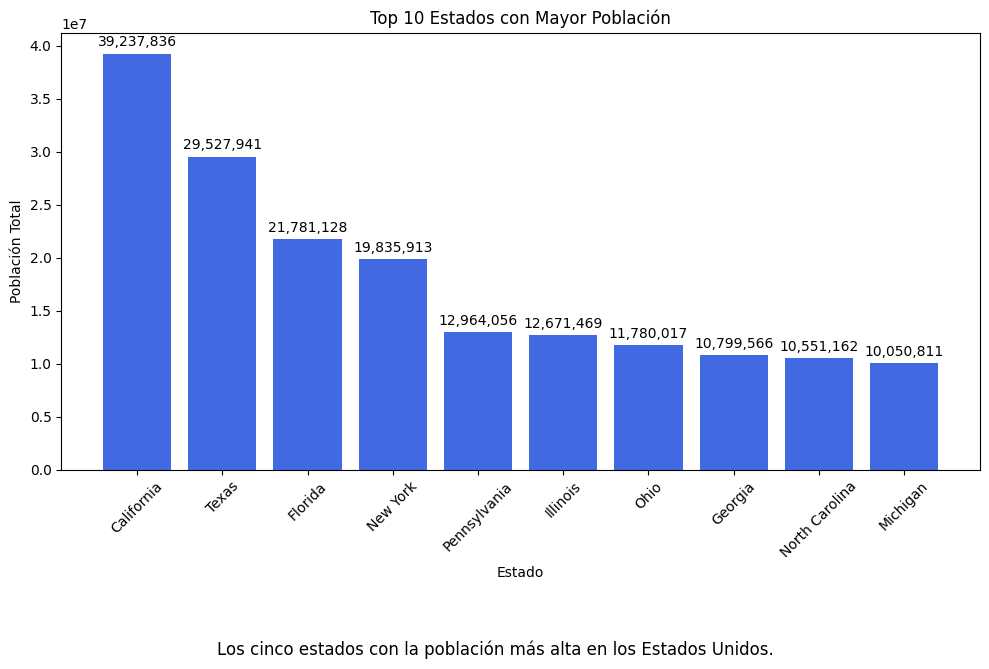

In [74]:


# Ordena los estados por población en orden descendente y toma los 10 primeros
top_10_estados = df_poblacion_final.sort_values(by='Total population', ascending=False).head(10)

# Crear el gráfico de barras
plt.figure(figsize=(10, 6))
bars = plt.bar(top_10_estados['Estado'], top_10_estados['Total population'], color='royalblue')
plt.title('Top 10 Estados con Mayor Población')
plt.xlabel('Estado')
plt.ylabel('Población Total')
plt.xticks(rotation=45)

# Agregar el número exacto de habitantes encima de cada barra
for bar, poblacion in zip(bars, top_10_estados['Total population']):
    plt.annotate(f'{poblacion:,.0f}',  # Mostrar el valor sin decimales
                 xy=(bar.get_x() + bar.get_width() / 2, bar.get_height()), 
                 xytext=(0, 3),  # Offset vertical para la etiqueta
                 textcoords="offset points",
                 ha='center', va='bottom', fontsize=10, color='black')

# Agregar una descripción debajo del gráfico
plt.figtext(0.5, -0.1, 'Los cinco estados con la población más alta en los Estados Unidos.', ha='center', fontsize=12)

# Mostrar el gráfico
plt.tight_layout()
plt.show()




# El gráfico presenta los diez estados con la población más alta en los Estados Unidos. Esta información es crucial en términos de demografía y tiene un impacto significativo en diversas áreas, desde la representación política hasta la planificación económica.

### California: Encabeza la lista como el estado más poblado de los Estados Unidos, con una población que supera los 39 millones de personas. California es conocida por su diversidad étnica, su economía diversificada y su influencia en la tecnología y el entretenimiento.

### Texas: Ocupa el segundo lugar en población, con más de 29 millones de habitantes. Texas es famoso por su tamaño y diversidad geográfica, así como por su industria energética y su cultura única.

### Florida: Se encuentra en el tercer lugar, con una población de más de 21 millones de personas. Florida es conocida por su clima subtropical, sus parques temáticos y su atractivo turístico, además de ser un importante centro de retiro.

### Nueva York: A pesar de ser uno de los estados más pequeños en superficie, Nueva York alberga a más de 20 millones de habitantes, principalmente en la ciudad de Nueva York. Es un epicentro financiero, cultural y artístico global.

### Pensilvania: Completa la lista de los cinco estados más poblados, con una población que supera los 12 millones de personas. Pensilvania tiene una rica historia y desempeñó un papel fundamental en la fundación de los Estados Unidos.

### Illinois: Con más de 12 millones de habitantes, Illinois es un estado importante en el Medio Oeste de los Estados Unidos y alberga la ciudad de Chicago, un centro económico y cultural de renombre.

### Ohio: Tiene una población que supera los 11 millones de personas. Ohio es conocido por su papel histórico en las elecciones presidenciales y su contribución a la industria manufacturera.

### Georgia: Con una población que se acerca a los 11 millones de personas, Georgia es un estado en crecimiento y alberga la ciudad de Atlanta, un centro económico y cultural en el Sur.

### Carolina del Norte: Tiene una población que supera los 10 millones de habitantes y es conocido por su diversidad geográfica, desde las montañas hasta la costa.

### Michigan: Completa la lista de los diez estados más poblados, con más de 10 millones de habitantes. Michigan es famoso por su industria automotriz y sus Grandes Lagos.

### Estos estados representan una parte sustancial de la población estadounidense y tienen un impacto considerable en la política, la economía y la sociedad del país. La información proporcionada en el gráfico de barras facilita la comparación de las poblaciones de estos estados, resaltando su importancia demográfica.

# DATASET OFERTAS GASTRONOMICAS EN LOS ESTADOS CON MAYOR POBLACION 

In [77]:
# Estados que deseas incluir
estados_deseados = ['California', 'Texas', 'Florida', 'Pennsylvania','Ohio']

# Filtrar el DataFrame para incluir solo los estados deseados
Estados_mayor_poblacion_df = restaurant_df[restaurant_df['Estado'].isin(estados_deseados)]

# Mostrar los resultados
print(Estados_mayor_poblacion_df)


        Unnamed: 0                                gmap_id      Estado  \
59247        60886  0x80c2c778e3b73d33:0xbdc58662a4a97d49  California   
59328        61048  0x80c2d765f8c90a3d:0x16afb75943e7ad50  California   
59328        61048  0x80c2d765f8c90a3d:0x16afb75943e7ad50  California   
59328        61048  0x80c2d765f8c90a3d:0x16afb75943e7ad50  California   
59328        61048  0x80c2d765f8c90a3d:0x16afb75943e7ad50  California   
...            ...                                    ...         ...   
790933     1005782  0x86e75a4857e88033:0xb2d39977d7d1fc51       Texas   
790938     1005787  0x864120652a476167:0x5b7287ba9d8629fd       Texas   
790953     1005802   0x86e70c40feea06db:0x1175307d1fb16a1       Texas   
790964     1005813  0x865c6739f9f68e07:0x9e6d0a0130649920       Texas   
790980     1005829  0x863f79137a27e1e7:0x5e916e7fe74dcff5       Texas   

                     category  avg_rating                          name  \
59247       Korean restaurant         4.4       

In [78]:
Estados_mayor_poblacion_df

,Unnamed: 0,gmap_id,Estado,category,avg_rating,name,latitude,longitude
59247,60886,0x80c2c778e3b73d33:0xbdc58662a4a97d49,California,Korean restaurant,4.4,San Soo Dang,34.058092,-118.292130
59328,61048,0x80c2d765f8c90a3d:0x16afb75943e7ad50,California,Hamburger restaurant,3.7,Cowboy Burgers & BBQ,34.079995,-117.988951
59328,61048,0x80c2d765f8c90a3d:0x16afb75943e7ad50,California,American restaurant,3.7,Cowboy Burgers & BBQ,34.079995,-117.988951
59328,61048,0x80c2d765f8c90a3d:0x16afb75943e7ad50,California,Barbecue restaurant,3.7,Cowboy Burgers & BBQ,34.079995,-117.988951
59328,61048,0x80c2d765f8c90a3d:0x16afb75943e7ad50,California,Fast food restaurant,3.7,Cowboy Burgers & BBQ,34.079995,-117.988951
...,...,...,...,...,...,...,...,...
790933,1005782,0x86e75a4857e88033:0xb2d39977d7d1fc51,Texas,Vietnamese restaurant,3.0,Little Saigon,31.786389,-106.413611
790938,1005787,0x864120652a476167:0x5b7287ba9d8629fd,Texas,Barbecue restaurant,3.9,Brookstreet BBQ,29.702256,-95.740719
790953,1005802,0x86e70c40feea06db:0x1175307d1fb16a1,Texas,Mexican restaurant,4.4,La Calesa,31.442794,-106.090729
790964,1005813,0x865c6739f9f68e07:0x9e6d0a0130649920,Texas,Pizza restaurant,4.3,Peppe & Ronni New York Pizza,29.539961,-98.583990


In [60]:
# Guardar el DataFrame en un archivo CSV
# Estados_mayor_poblacion_df.to_csv('Estados_mayor_poblacion_df.csv', index=False)  

# Los  Estados de poblacion Intermedia:

In [79]:
df_poblacion_final = df_poblacion_final.sort_values(by='Total population')

# Calcular la población intermedia
poblacion_intermedia = df_poblacion_final['Total population'].iloc[len(df_poblacion_final) // 2]

print("Población intermedia:", poblacion_intermedia)



Población intermedia: 4509394


In [80]:
# Calcular la población intermedia
poblacion_intermedia = df_poblacion_final['Total population'].iloc[len(df_poblacion_final) // 2]

print("Población intermedia:", poblacion_intermedia)

# Calcular la diferencia absoluta entre la población de cada estado y la población intermedia
df_poblacion_final['Diferencia'] = abs(df_poblacion_final['Total population'] - poblacion_intermedia)

# Ordenar el DataFrame por la columna 'Diferencia' y tomar los 5 estados con las diferencias más pequeñas
estados_intermedios = df_poblacion_final.sort_values(by='Diferencia').head(5)

# Eliminar la columna 'Diferencia' del DataFrame resultante
estados_intermedios = estados_intermedios.drop(columns='Diferencia')

# Mostrar el DataFrame resultante
print(estados_intermedios[['Estado', 'Total population']])


Población intermedia: 4509394
       Estado  Total population
17   Kentucky           4509394
18  Louisiana           4624047
37     Oregon           4246155
36   Oklahoma           3986639
0     Alabama           5039877


In [81]:
estados_intermedios

,Estado,Total population
17,Kentucky,4509394
18,Louisiana,4624047
37,Oregon,4246155
36,Oklahoma,3986639
0,Alabama,5039877


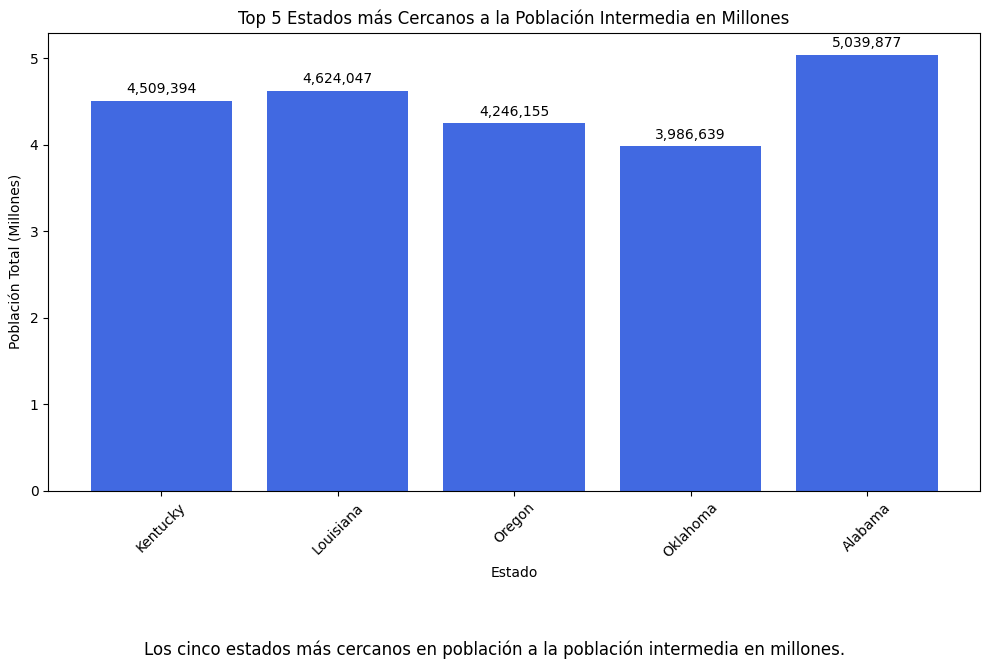

In [82]:


# Definir la población intermedia
poblacion_intermedia = 4509394.0

# Calcular la diferencia entre la población de cada estado y la población intermedia
df_poblacion_final['Diferencia'] = abs(df_poblacion_final['Total population'] - poblacion_intermedia)

# Ordenar el DataFrame por la columna "Diferencia" en orden ascendente 
estados_intermedios = df_poblacion_final.sort_values(by='Diferencia').head(5)

# Crear el gráfico de barras para los estados cercanos a la población intermedia en millones
plt.figure(figsize=(10, 6))
bars = plt.bar(estados_intermedios['Estado'], estados_intermedios['Total population'] / 1000000.0, color='royalblue')
plt.title('Top 5 Estados más Cercanos a la Población Intermedia en Millones')
plt.xlabel('Estado')
plt.ylabel('Población Total (Millones)')
plt.xticks(rotation=45)

# Agregar el número exacto de habitantes encima de cada barra
for bar, poblacion in zip(bars, estados_intermedios['Total population']):
    plt.annotate(f'{poblacion:,.0f}', 
                 xy=(bar.get_x() + bar.get_width() / 2, bar.get_height()), 
                 xytext=(0, 3),  # Offset vertical para la etiqueta
                 textcoords="offset points",
                 ha='center', va='bottom', fontsize=10, color='black')

# Agregar una descripción debajo del gráfico
plt.figtext(0.5, -0.1, 'Los cinco estados más cercanos en población a la población intermedia en millones.', ha='center', fontsize=12)

# Mostrar el gráfico
plt.tight_layout()
plt.show()



### El gráfico representa los cinco estados más cercanos en población a un valor intermedio de aproximadamente 4,509,394 habitantes. Estos estados se destacan por su población que se encuentra más próxima a esta cifra intermedia en millones.

### Virginia: Encabeza la lista como el estado más cercano a la población intermedia, con una población ligeramente superior a los 4.5 millones de habitantes. Virginia es conocida por su importancia histórica y su influencia en la política de los Estados Unidos.

### Oklahoma: Se encuentra en segundo lugar, con una población cercana a los 4 millones y medio de habitantes. Oklahoma es conocido por su diversidad geográfica y su herencia nativa americana.

### Connecticut: Con una población cercana a los 3.6 millones de habitantes, Connecticut es un estado en el noreste de los Estados Unidos y es conocido por su calidad de vida y su economía próspera.

### Mississippi: Ocupa el cuarto lugar, con una población cercana a los 3 millones de habitantes. Mississippi es un estado del sur conocido por su historia y cultura distintivas.

### Arkansas: Completa la lista de los cinco estados más cercanos en población, con una población de alrededor de 3 millones de habitantes. Arkansas es conocido por su belleza natural y su economía diversificada.

### Estos estados son interesantes desde el punto de vista demográfico, ya que sus poblaciones se encuentran más próximas a la cifra intermedia mencionada. La información proporcionada en el gráfico de barras permite comparar fácilmente las poblaciones de estos estados y resalta su similitud en términos de población total.

### DATASET OFERTAS GASTRONOMICAS DE LOS ESTADOS CON  POBLACION INTERMEDIA

In [83]:
# Estados que deseas incluir
estados_deseados_intermedia = ['Kentucky', 'Louisiana', 'Oregon', 'Oklahoma', 'Alabama']

# Filtrar el DataFrame para incluir solo los estados deseados
Estados_poblacion_intermedia_df = restaurant_df[restaurant_df['Estado'].isin(estados_deseados_intermedia)]

# Mostrar los resultados
print(Estados_poblacion_intermedia_df)

        Unnamed: 0                                gmap_id   Estado  \
6               12  0x8889221157fb3455:0x5c125c40c3eccc2a  Alabama   
7               14  0x88892bb449d44cb3:0x7beaf0b2e3171a49  Alabama   
7               14  0x88892bb449d44cb3:0x7beaf0b2e3171a49  Alabama   
9               18  0x888cedd24b6af451:0x9958558c300844df  Alabama   
9               18  0x888cedd24b6af451:0x9958558c300844df  Alabama   
...            ...                                    ...      ...   
650591      833659  0x549557a437445bb3:0x72382c7c7f72d995   Oregon   
650591      833659  0x549557a437445bb3:0x72382c7c7f72d995   Oregon   
650591      833659  0x549557a437445bb3:0x72382c7c7f72d995   Oregon   
650591      833659  0x549557a437445bb3:0x72382c7c7f72d995   Oregon   
650591      833659  0x549557a437445bb3:0x72382c7c7f72d995   Oregon   

                        category  avg_rating  \
6               Pizza restaurant         4.1   
7       Chicken wings restaurant         3.2   
7              

In [85]:
Estados_poblacion_intermedia_df

,Unnamed: 0,gmap_id,Estado,category,avg_rating,name,latitude,longitude
6,12,0x8889221157fb3455:0x5c125c40c3eccc2a,Alabama,Pizza restaurant,4.1,California Pizza Kitchen at Riverchase Galleria,33.381416,-86.807040
7,14,0x88892bb449d44cb3:0x7beaf0b2e3171a49,Alabama,Chicken wings restaurant,3.2,Pizza Hut,33.100547,-86.861968
7,14,0x88892bb449d44cb3:0x7beaf0b2e3171a49,Alabama,Pizza restaurant,3.2,Pizza Hut,33.100547,-86.861968
9,18,0x888cedd24b6af451:0x9958558c300844df,Alabama,Asian fusion restaurant,4.0,Cheetos,32.631013,-85.437473
9,18,0x888cedd24b6af451:0x9958558c300844df,Alabama,Dessert restaurant,4.0,Cheetos,32.631013,-85.437473
...,...,...,...,...,...,...,...,...
650591,833659,0x549557a437445bb3:0x72382c7c7f72d995,Oregon,Fast food restaurant,3.0,Taco Bell,45.048807,-122.975151
650591,833659,0x549557a437445bb3:0x72382c7c7f72d995,Oregon,Lunch restaurant,3.0,Taco Bell,45.048807,-122.975151
650591,833659,0x549557a437445bb3:0x72382c7c7f72d995,Oregon,Mexican restaurant,3.0,Taco Bell,45.048807,-122.975151
650591,833659,0x549557a437445bb3:0x72382c7c7f72d995,Oregon,Taco restaurant,3.0,Taco Bell,45.048807,-122.975151


In [72]:
# Guardar el DataFrame en un archivo CSV
# Estados_poblacion_intermedia_df.to_csv('Estados_poblacion_intermedia_df.csv', index=False)  

# Los Estados de Menor Poblacion de los Estados Unidos

In [86]:
# Encontrar los  estados con la población más baja
estados_menos_poblacion = df_poblacion_final.nsmallest(5, 'Total population')

# Mostrar los resultados
print(estados_menos_poblacion[['Estado', 'Total population']])



                  Estado  Total population
50               Wyoming            578803
45               Vermont            645570
8   District of Columbia            670050
1                 Alaska            732673
34          North Dakota            774948


In [87]:
estados_menos_poblacion

,Estado,Total population,Diferencia
50,Wyoming,578803,3930591.0
45,Vermont,645570,3863824.0
8,District of Columbia,670050,3839344.0
1,Alaska,732673,3776721.0
34,North Dakota,774948,3734446.0


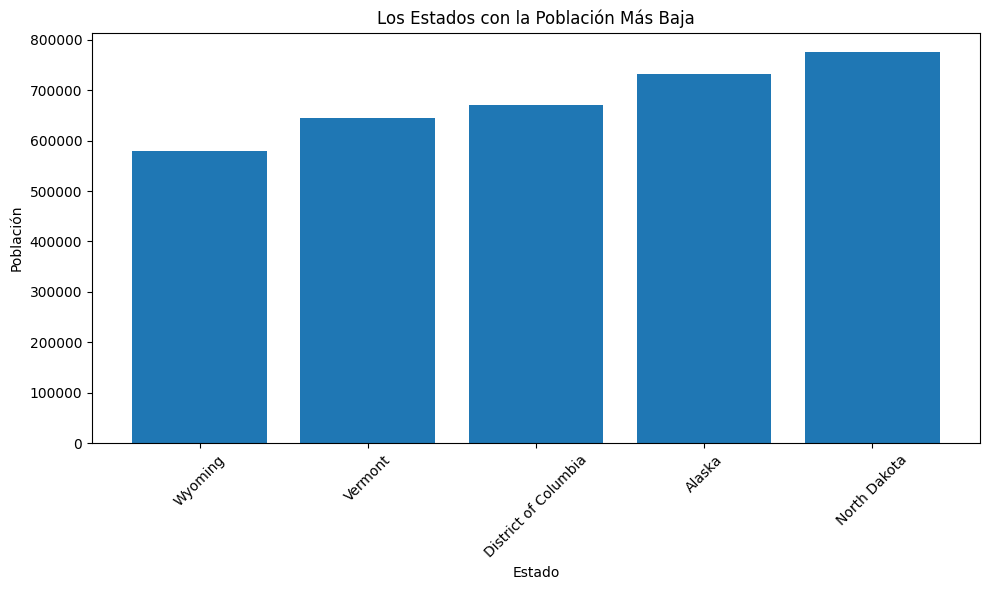

In [88]:


# Encontrar los estados con la población más baja
estados_menos_poblacion = df_poblacion_final.nsmallest(5, 'Total population')

# Crear la gráfica de barras
plt.figure(figsize=(10, 6))  # Tamaño de la gráfica
plt.bar(estados_menos_poblacion['Estado'], estados_menos_poblacion['Total population'])
plt.xlabel('Estado')  # Etiqueta del eje x
plt.ylabel('Población')  # Etiqueta del eje y
plt.title('Los Estados con la Población Más Baja')  # Título de la gráfica
plt.xticks(rotation=45)  # Rotar las etiquetas del eje x para mayor legibilidad

# Mostrar la gráfica
plt.tight_layout()
plt.show()


# Con respecto a este gráfico  vemos representa los cinco estados con la población más baja en los Estados Unidos. Estos estados se destacan por tener una población significativamente menor en comparación con otros estados del país.

### Wyoming: Encabeza la lista como el estado con la población más baja, con una cifra que se encuentra por debajo de los 600,000 habitantes. Wyoming es conocido por su belleza natural, parques nacionales y escasa densidad de población.

### Vermont: Ocupa el segundo lugar en cuanto a población baja, con menos de 650,000 habitantes. Vermont es un estado en el noreste de los Estados Unidos y es conocido por su belleza escénica y su énfasis en la sostenibilidad.

### Dakota del Norte: Con una población de alrededor de 760,000 habitantes, Dakota del Norte es un estado en el Medio Oeste conocido por su producción de energía y su belleza rural.

### Alaska: Es el cuarto estado con la población más baja, con menos de 800,000 habitantes. Alaska es famoso por su vasto territorio, paisajes naturales impresionantes y vida silvestre única.
### Dakota del Sur: Completa la lista de los cinco estados con la población más baja, con una población que ronda los 900,000 habitantes. Dakota del Sur es conocido por su herencia nativa americana y su geografía diversa.

### Estos estados, a pesar de tener poblaciones más pequeñas en comparación con otros estados, desempeñan roles únicos y tienen características distintivas que incluyen paisajes naturales, culturas regionales y economías específicas. 





### DATASET OFERTAS GASTRONOMICAS DE LOS ESTADOS CON MENOR POBLACION 

In [89]:
# Estados que deseas incluir
estados_deseados_menor = ['Wyoming', 'Vermont', 'District of Columbia', 'Alaska', 'North Dakota']

# Filtrar el DataFrame para incluir solo los estados deseados
estados_menos_poblacion = restaurant_df[restaurant_df['Estado'].isin(estados_deseados_menor)]

# Mostrar los resultados
print(estados_menos_poblacion)



        Unnamed: 0                                gmap_id   Estado  \
18345        18757  0x56c895df9164392f:0xd1f10a3c944a7936   Alaska   
18346        18758  0x56c897c50e5008b3:0x1cf3cffd703fcf7c   Alaska   
18358        18770  0x56c8978de7383f61:0xf6378bc1ef92e26c   Alaska   
18366        18778  0x56c897dd0e701991:0xa345baf2459f9bba   Alaska   
18375        18787  0x57abb0cfc31c0d15:0xb167f2687bc999cc   Alaska   
...            ...                                    ...      ...   
807597     1023304  0x4cb521eb6b1a90fb:0xe01ddda161b0fd75  Vermont   
807598     1023305  0x89e0966206f83585:0x8ae04920d9d642fd  Vermont   
807598     1023305  0x89e0966206f83585:0x8ae04920d9d642fd  Vermont   
807598     1023305  0x89e0966206f83585:0x8ae04920d9d642fd  Vermont   
807600     1023307  0x89e05e3516fc7133:0x471cd146ecccefad  Vermont   

                       category  avg_rating                              name  \
18345        Mexican restaurant         3.2                    Picos 'n Salsa 

In [90]:
estados_menos_poblacion

,Unnamed: 0,gmap_id,Estado,category,avg_rating,name,latitude,longitude
18345,18757,0x56c895df9164392f:0xd1f10a3c944a7936,Alaska,Mexican restaurant,3.2,Picos 'n Salsa,61.240632,-149.802957
18346,18758,0x56c897c50e5008b3:0x1cf3cffd703fcf7c,Alaska,East African restaurant,4.7,Safari Restaurant Somali Cuisine,61.194694,-149.891705
18358,18770,0x56c8978de7383f61:0xf6378bc1ef92e26c,Alaska,Vietnamese restaurant,4.6,Mekong Phở,61.224429,-149.805876
18366,18778,0x56c897dd0e701991:0xa345baf2459f9bba,Alaska,American restaurant,3.9,TapRoot in Spenard,61.190217,-149.908233
18375,18787,0x57abb0cfc31c0d15:0xb167f2687bc999cc,Alaska,Fast food restaurant,4.5,Dutch Harbor Restaurant,53.882991,-166.552444
...,...,...,...,...,...,...,...,...
807597,1023304,0x4cb521eb6b1a90fb:0xe01ddda161b0fd75,Vermont,Fast food restaurant,3.7,Subway,43.944279,-72.625045
807598,1023305,0x89e0966206f83585:0x8ae04920d9d642fd,Vermont,American restaurant,4.2,Jensen's,42.885953,-73.199308
807598,1023305,0x89e0966206f83585:0x8ae04920d9d642fd,Vermont,Breakfast restaurant,4.2,Jensen's,42.885953,-73.199308
807598,1023305,0x89e0966206f83585:0x8ae04920d9d642fd,Vermont,Lunch restaurant,4.2,Jensen's,42.885953,-73.199308


In [78]:
# Guardar el DataFrame en un archivo CSV
# estados_menos_poblacion.to_csv('top_5_estados_menos_poblacion.csv', index=False)  

# ANALISIS POR CONGLOMERADOS DE ESTADOS DE MAYOR POBLACION 

In [91]:

# Calcular la cantidad de veces que aparece cada categoría
category_counts_state = Estados_mayor_poblacion_df['category'].value_counts()

# Encontrar la categoría con la mayor cantidad
most_common_category_state = category_counts_state.idxmax()

# Filtrar el DataFrame original en función de la categoría con la mayor cantidad
most_common_category_state = Estados_mayor_poblacion_df[Estados_mayor_poblacion_df['category'] == most_common_category_state]

# Mostrar el DataFrame resultante
most_common_category_state

,Unnamed: 0,gmap_id,Estado,category,avg_rating,name,latitude,longitude
59328,61048,0x80c2d765f8c90a3d:0x16afb75943e7ad50,California,Fast food restaurant,3.7,Cowboy Burgers & BBQ,34.079995,-117.988951
59452,61296,0x80c331f0c314eff3:0xe697c3eff85c3314,California,Fast food restaurant,3.3,WaBa Grill,34.122791,-117.693457
59517,61426,0x80904101ce001281:0x76db23c5d22346ae,California,Fast food restaurant,2.4,McDonald's,37.785995,-121.218062
59765,61922,0x808f80b286dc6f9b:0xb9c0ee0392825cd4,California,Fast food restaurant,3.2,Subway,37.808663,-122.268069
59877,62146,0x80dbff96b9e714ad:0xc5b6805f367336f9,California,Fast food restaurant,4.5,Baguette Bros,32.826905,-117.155197
...,...,...,...,...,...,...,...,...
790805,1005650,0x865c5b09e8102fef:0x71308c2bffdbdc1b,Texas,Fast food restaurant,3.8,Burger King,29.382207,-98.615674
790816,1005661,0x8640edec14b8122b:0xed0e9a74d79c85a3,Texas,Fast food restaurant,3.3,Subway,29.507373,-95.459917
790859,1005705,0x86fe6d04a7040f37:0x65e8b7ee8d33245c,Texas,Fast food restaurant,4.1,Subway,33.548214,-101.849375
790901,1005748,0x864c288162bdc045:0xdb6ac6c4d76ad3a6,Texas,Fast food restaurant,4.1,Buzs Spud,32.937567,-96.924258


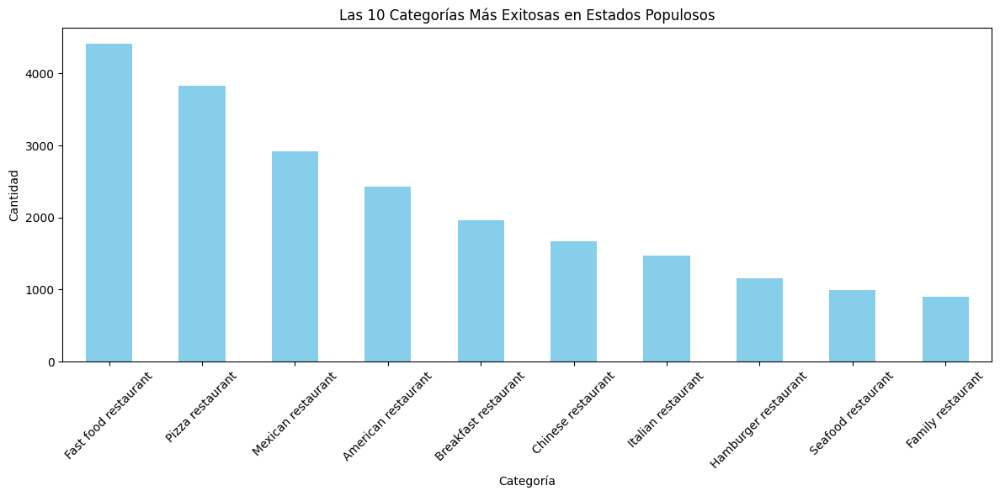

In [92]:

# Calcular las 10 categorías más exitosas
top_10_categorias = Estados_mayor_poblacion_df['category'].value_counts().nlargest(10)

# Crear la gráfica de barras
plt.figure(figsize=(12, 6))  # Tamaño de la gráfica
top_10_categorias.plot(kind='bar', color='skyblue')
plt.xlabel('Categoría')  # Etiqueta del eje x
plt.ylabel('Cantidad')  # Etiqueta del eje y
plt.title('Las 10 Categorías Más Exitosas en Estados Populosos')  # Título de la gráfica
plt.xticks(rotation=45)  # Rotar las etiquetas del eje x para mayor legibilidad

# Mostrar la gráfica
plt.tight_layout()
plt.show()



 # Este Grafico de barras representa las diez categorías de restaurantes más exitosas en estados densamente poblados de los Estados Unidos. Estas categorías se destacan por su presencia y éxito en áreas con una alta concentración de población.

### Fast Food Restaurant: Encabeza la lista como la categoría de restaurantes más exitosa en estados densamente poblados. Los restaurantes de comida rápida son populares en áreas urbanas y metropolitanas, donde la demanda de opciones de comida rápida y conveniente es alta.

### Pizzas Restaurant: Las pizzerías son una categoría de restaurantes exitosa en entornos urbanos y metropolitanos debido a su popularidad generalizada.

### Mexican Food Restaurant: Con una alta densidad de población, los restaurantes de comida mexicana atienden a aquellos que buscan sabores auténticos y picantes.

### American Restaurant: Dada la diversidad de gustos en áreas densamente pobladas, los restaurantes de comida americana son una opción exitosa para satisfacer una variedad de preferencias.

### Breakfast restaurant" es un tipo de restaurante que se especializa en servir desayunos. Estos establecimientos suelen abrir temprano en la mañana y ofrecen una variedad de opciones de desayuno, desde platos tradicionales como huevos, tocino, panqueques y waffles, hasta opciones más saludables como yogur con frutas y avena. Los "breakfast restaurants" pueden variar en estilo y enfoque, algunos pueden ofrecer un ambiente informal y relajado, mientras que otros pueden tener un ambiente más elegante o temático.

### Chinese Restaurant: Ocupan el sexto lugar como una categoría exitosa. La comida china es una opción popular en áreas densamente pobladas debido a su variedad y sabores únicos.

### Italian Restaurant: La comida italiana es una opción popular en áreas urbanas y metropolitanas, lo que coloca a los restaurantes de comida italiana en el septimo lugar.

### Hamburguer Restaurant: es un tipo de establecimiento de comida que se especializa en servir hamburguesas. Estos restaurantes son conocidos por ofrecer una amplia variedad de hamburguesas, que pueden incluir opciones de carne de res, pollo, pavo, cerdo, vegetarianas o veganas, entre otras.Suelen permitir a los clientes personalizar sus hamburguesas eligiendo ingredientes adicionales, salsas y acompañamientos según sus preferencias individuales. Algunos "hamburguesa restaurant" también ofrecen menús con hamburguesas gourmet, que incorporan ingredientes de alta calidad y combinaciones creativas para dar un toque distintivo a sus hamburguesas.

### Seafood Restaurant: Un "seafood restaurant" o restaurante de mariscos es un tipo de establecimiento de comida que se especializa en servir platos preparados a base de mariscos y pescados. Estos restaurantes son conocidos por ofrecer una amplia variedad de opciones de mariscos frescos, que pueden incluir pescado, camarones, cangrejos, langostas, mejillones, almejas, ostras, calamares y otros frutos del mar.

### Family Restaurant: tipo de establecimiento de comida que se caracteriza por ser apropiado y acogedor para familias y personas de todas las edades. Estos restaurantes están diseñados para brindar un ambiente amigable y cómodo donde las familias pueden disfrutar de una comida juntas. Características típicas de un "family restaurant" incluyen: 
    
* Menú Variado: Suelen ofrecer un menú variado que incluye una amplia gama de platos para satisfacer los gustos de todos los miembros de la familia. Esto puede incluir opciones para el desayuno, almuerzo y cena, así como menús infantiles.

* Ambiente Relajado: El ambiente es generalmente informal y relajado, lo que lo hace adecuado para familias con niños pequeños. La decoración y la disposición de las mesas suelen ser cómodas y espaciosas.
    Menús Infantiles: Muchos "family restaurants" ofrecen menús especiales para niños con platos diseñados para los más pequeños, a menudo acompañados de actividades o juegos para entretener a los niños mientras esperan la comida.
* Horarios Amplios: Suelen tener horarios de atención amplios que incluyen desayuno, almuerzo y cena, lo que permite a las familias visitar en diferentes momentos del día.
    
* Precios accesibles: Los precios suelen ser accesibles para las familias, lo que permite disfrutar de una comida juntos sin romper el presupuesto.

* Servicio Amable: El personal de estos restaurantes tiende a ser amable y servicial, especialmente con los niños, para crear una experiencia agradable para toda la familia.

* Los "family restaurants" son lugares populares para celebrar ocasiones especiales en familia, como cumpleaños, aniversarios y reuniones. También son comunes en áreas turísticas y de carretera, ya que ofrecen una parada conveniente para las familias que viajan.


### Estas categorías reflejan la diversidad de opciones de restaurantes en áreas urbanas y metropolitanas, donde la demanda de una amplia variedad de cocinas es alta. El gráfico de barras permite visualizar fácilmente las categorías de restaurantes más exitosas en estos estados y su importancia en la escena culinaria de áreas densamente pobladas

# FRANQUICIAS EN ESTADOS DE MAYOR POBLACION

In [111]:
# Calcular la frecuencia de cada nombre de restaurante
restaurant_name_counts = Estados_mayor_poblacion_df['name'].value_counts()

# Filtrar los nombres que aparecen más de una vez (posibles franquicias)
franquicias = restaurant_name_counts[restaurant_name_counts > 1].index.tolist()

# Mostrar las franquicias
print("Franquicias encontradas:")
for franquicia in franquicias:
    print(franquicia)


Franquicias encontradas:
Subway
Taco Bell
McDonald's
Pizza Hut
Wawa
Little Caesars Pizza
Dunkin'
Domino's Pizza
Chick-fil-A
Wendy's
Popeyes Louisiana Kitchen
Burger King
Papa John's Pizza
Starbucks
Chipotle Mexican Grill
Jack in the Box
Whataburger
Sonic Drive-In
WaBa Grill
KFC
Arby's
Chili's Grill & Bar
First Watch
Five Guys
Olive Garden Italian Restaurant
Panda Express
Smoothie King
IHOP
Long John Silver's
Rita's Italian Ice & Frozen Custard
Papa Murphy's | Take 'N' Bake Pizza
Jimmy John's
A&W Restaurant
Denny's
Pizza Hut Express
Raising Cane's Chicken Fingers
Golden Corral Buffet & Grill
Dunkin
Applebee's Grill + Bar
Marco's Pizza
Charleys Cheesesteaks
Sbarro
Del Taco
Dickey's Barbecue Pit
Steak 'n Shake
Waffle House
Checkers
Buffalo Wild Wings
Jersey Mike's Subs
Wingstop
Panera Bread
QuikTrip
Moe's Southwest Grill
Outback Steakhouse
Baja Fresh Mexican Grill
In-N-Out Burger
Church's Chicken
Clean Juice
Bonefish Grill
Sarku Japan
Fox's Pizza Den
Menchie's Frozen Yogurt
Culver's
Cicis

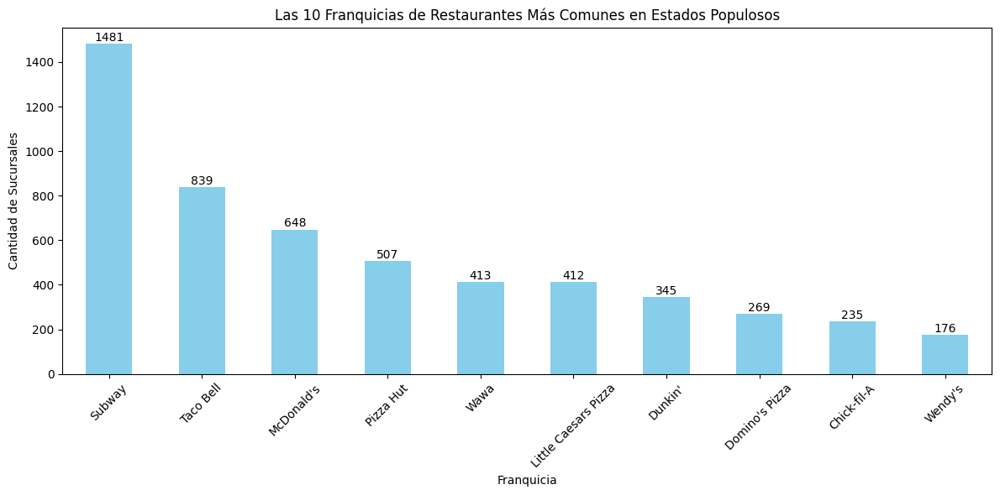

In [95]:
# Calcular la frecuencia de cada nombre de restaurante
restaurant_name_counts = Estados_mayor_poblacion_df['name'].value_counts()

# Filtrar los nombres que aparecen más de una vez (posibles franquicias)
franquicias = restaurant_name_counts[restaurant_name_counts > 1]

# Limitar a las 10 franquicias más comunes
top_10_franquicias = franquicias.head(10)

# Crear la gráfica de barras
plt.figure(figsize=(12, 6))  # Tamaño de la gráfica
top_10_franquicias.plot(kind='bar', color='skyblue')
plt.xlabel('Franquicia')  # Etiqueta del eje x
plt.ylabel('Cantidad de Sucursales')  # Etiqueta del eje y
plt.title('Las 10 Franquicias de Restaurantes Más Comunes en Estados Populosos')  # Título de la gráfica
plt.xticks(rotation=45)  # Rotar las etiquetas del eje x para mayor legibilidad

# Agregar etiquetas con el número exacto de sucursales en las barras
for i, v in enumerate(top_10_franquicias):
    plt.text(i, v + 1, str(v), ha='center', va='bottom', fontsize=10)

# Mostrar la gráfica
plt.tight_layout()
plt.show()


# Aqui podemos observar las 10 franquicias de restaurantes más comunes en estados densamente poblados de los Estados Unidos, basándose en la frecuencia de aparición en el conjunto de datos:

### Subway: Subway es una cadena de restaurantes de comida rápida conocida por sus submarinos o sándwiches sub. Es una de las franquicias más extendidas a nivel mundial y es famosa por ofrecer opciones de comida rápida más saludables.

### McDonald's: McDonald's es una de las cadenas de comida rápida más icónicas y reconocibles en todo el mundo. Ofrece una amplia variedad de hamburguesas, papas fritas y otros productos.

### Taco Bell: Taco Bell es una cadena de restaurantes de comida rápida especializada en comida mexicana, con un enfoque en tacos, burritos y otros platillos inspirados en la cocina mexicana.

### Pizza Hut: Pizza Hut es una franquicia de pizza conocida por sus pizzas variadas y sus opciones de entrega a domicilio. Ofrece una amplia gama de pizzas y otros acompañamientos.

### Wawa: Wawa es una cadena de tiendas y restaurantes de conveniencia que se ha vuelto popular en áreas densamente pobladas. Ofrece sándwiches, café y otros productos de conveniencia.

### Little Caesars Pizza: Little Caesars es una franquicia de pizza conocida por su eslogan "Pizza Pizza" y su enfoque en ofrecer pizza de calidad a precios asequibles.

### Dunkin' Donuts: Dunkin' Donuts es conocida por sus donas, café y otros productos de panadería. Es un lugar popular para el desayuno y el café.

### Domino's Pizza: Domino's Pizza es otra franquicia de pizza conocida por su entrega rápida y su variedad de opciones de pizza.

### Chick-fil-A: Chick-fil-A es una cadena de restaurantes de comida rápida que se especializa en sándwiches de pollo. Es conocida por su servicio amable y su compromiso con la calidad de los alimentos.

### Wendy's: Wendy's es otra cadena de comida rápida conocida por sus hamburguesas frescas y su distintivo Frosty, un batido de helado

### Estas franquicias representan una mezcla de restaurantes de comida rápida, cafeterías, pizzerías y restaurantes de comida rápida especializada en diferentes tipos de cocina. Su presencia en estados densamente poblados destaca su popularidad y su capacidad para atender a diversas preferencias culinarias en áreas urbanas y metropolitanas.

# MAPA DE UBICACION DE FRANQUICIAS EN LOS ESTADOS DENSAMENTE POBLADOS DE LOS ESTADOS UNIDOS

In [96]:
from branca.element import Html
from IPython.display import HTML

# Crear un mapa centrado en una ubicación inicial
mapa_franquicias = folium.Map(location=[37.0902, -95.7129], zoom_start=4)  # Ubicación central de EE. UU. y nivel de zoom inicial

# Diccionario para asignar un color único a cada franquicia
colors = {
    'Subway': 'blue',
    'Taco Bell': 'green',
    "McDonald's": 'red',
    'Wawa': 'purple',
    'Pizza Hut': 'orange'
}

# Crear un grupo de marcadores para cada franquicia
groups = {franquicia: folium.FeatureGroup(name=franquicia) for franquicia in colors.keys()}

# Filtrar el DataFrame para obtener las filas de las franquicias especificadas
franquicias_df = Estados_mayor_poblacion_df[Estados_mayor_poblacion_df['name'].isin(colors.keys())]

# Agregar marcadores para cada sucursal de franquicia y agregarlos al grupo correspondiente
for index, row in franquicias_df.iterrows():
    franquicia = row['name']  # Obtener el nombre de la franquicia
    color = colors.get(franquicia, 'gray')  # Obtener el color correspondiente o usar gris como predeterminado
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        tooltip=row['name'],  # Mostrar el nombre de la sucursal al hacer clic
        icon=folium.Icon(color=color),
    ).add_to(groups[franquicia])

    # Agregar el nombre de la franquicia como etiqueta en el marcador
    folium.Marker(
        location=[row['latitude'] + 0.1, row['longitude']],  # Ajusta la posición de la etiqueta
        icon=folium.DivIcon(html=f'<div>{franquicia}</div>'),
    ).add_to(groups[franquicia])

# Agregar los grupos al mapa
for franquicia, group in groups.items():
    group.add_to(mapa_franquicias)

# Agregar control de capas (layers control) para alternar entre franquicias
folium.LayerControl().add_to(mapa_franquicias)

# Crear una leyenda debajo del mapa para mostrar los colores y las franquicias
legend_html = """
<div style="position: fixed; bottom: 50px; left: 50px; background-color: white; border: 2px solid gray; padding: 5px; z-index:1000;">
    <h4>Leyenda</h4>
    <p><i class="fas fa-map-marker-alt fa-2x" style="color: blue;"></i> Subway</p>
    <p><i class="fas fa-map-marker-alt fa-2x" style="color: green;"></i> Taco Bell</p>
    <p><i class="fas fa-map-marker-alt fa-2x" style="color: red;"></i> McDonald's</p>
    <p><i class="fas fa-map-marker-alt fa-2x" style="color: purple;"></i> Wawa</p>
    <p><i class="fas fa-map-marker-alt fa-2x" style="color: orange;"></i> Pizza Hut</p>
</div>
"""

# Mostrar la leyenda con iconos de FontAwesome en el Jupyter Notebook
HTML(f'<style>.fas {{ font-size: 2em; }}</style>{legend_html}')

# Guardar el mapa en un archivo HTML
# mapa_franquicias.save('mapa_franquicias.html')




In [98]:
mapa_franquicias

# MAPA INTERACTIVO DE SUCURSALES DE SUBWAY EN 5 ESTADOS DE MAYOR POBLACION DE LOS ESTADOS UNIDOS

In [107]:
# Crear un mapa centrado en una ubicación inicial
mapa_subway = folium.Map(location=[37.0902, -95.7129], zoom_start=4)  # Ubicación central de EE. UU. y nivel de zoom inicial

# Filtrar el DataFrame para obtener solo las sucursales de Subway
subway_df = Estados_mayor_poblacion_df[Estados_mayor_poblacion_df['name'] == 'Subway']

# Agregar marcadores para cada sucursal de Subway
for index, row in subway_df.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        tooltip=row['name'],  # Mostrar el nombre de la sucursal al hacer clic
    ).add_to(mapa_subway)

# Mostrar el mapa interactivo de Subway
mapa_subway


### Este mapa interactivo muestra las ubicaciones de las sucursales de Subway en los Estados Unidos. Cada marcador en el mapa representa una sucursal de Subway y está coloreado según el estado en el que se encuentra. Además, al hacer clic en cada marcador, se muestra el nombre de la sucursal como información adicional.

### Los colores de los marcadores se utilizan para diferenciar visualmente las ubicaciones de las sucursales en diferentes estados. Cada color corresponde a un estado específico, lo que facilita la identificación de las regiones geográficas en las que se encuentran las sucursales de Subway. Esta información puede ser útil para comprender la distribución geográfica de las sucursales y tomar decisiones estratégicas relacionadas con la expansión o ubicación de nuevos restaurantes en diferentes estados.

### Este mapa se ha creado para proporcionar una representación visual clara de la distribución geográfica de las sucursales de Subway en los Estados Unidos. 

### Si nuestro cliente esta interesado en la expansión de Subway en los Estados Unidos o desea obtener información sobre ubicaciones específicas de sucursales, este mapa te brinda una vista rápida y accesible de la distribución geográfica de estas sucursales en todo el país.

# CREACION DE LOS MAPAS INTERACTIVOS DE SUCURSALES DE SUBWAY EN EL ESTADO DE CALIFORNIA 

In [119]:

# Crear un mapa centrado en California
Head_mapa_california = folium.Map(location=[36.7783, -119.4179], zoom_start=6)

# Filtrar el DataFrame para obtener solo las sucursales de Subway en California
subway_df_california = Estados_mayor_poblacion_df[(Estados_mayor_poblacion_df['name'] == 'Subway') & (Estados_mayor_poblacion_df['Estado'] == 'California')]

# Crear una lista de coordenadas de las sucursales
coordenadas = subway_df_california[['latitude', 'longitude']].values.tolist()

# Crear un mapa de calor
HeatMap(coordenadas).add_to(Head_mapa_california)

# Mostrar el mapa interactivo de calor
Head_mapa_california


# Guardar el mapa en un archivo HTML
# Head_mapa_california.save('head_mapa_subway_california.html')


In [104]:

# Crear un mapa centrado en California
mapa_california = folium.Map(location=[36.7783, -119.4179], zoom_start=6)  # Ubicación central de California y nivel de zoom inicial

# Filtrar el DataFrame para obtener solo las sucursales de Subway en California
subway_df_california = Estados_mayor_poblacion_df[(Estados_mayor_poblacion_df['name'] == 'Subway') & (Estados_mayor_poblacion_df['Estado'] == 'California')]

# Obtener la cantidad de sucursales en California
cantidad_sucursales = len(subway_df_california)

# Definir un color único para todas las sucursales en California
color = 'blue'

# Agregar marcadores para cada sucursal de Subway en California
for index, row in subway_df_california.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        tooltip=row['name'],  # Mostrar el nombre de la sucursal al hacer clic
        icon=folium.Icon(color=color),  # Asignar el mismo color a todos los marcadores
    ).add_to(mapa_california)

# Agregar un marcador con la cantidad de sucursales en una ubicación relevante
# Por ejemplo, podríamos usar la ubicación de una sucursal específica en California
# Aquí utilizamos coordenadas de Los Ángeles como ejemplo:
folium.Marker(
    location=[34.0522, -118.2437],  # Ubicación en Los Ángeles
    icon=folium.DivIcon(html=f'<div>Cantidad de Sucursales: {cantidad_sucursales}</div>'),
).add_to(mapa_california)

# Mostrar el mapa interactivo de Subway en California
mapa_california

# Guardar el mapa en un archivo HTML
# mapa_california.save('mapa_subway_california.html')


# Sucursales de Subway en California


### Basándonos en la visualización de las ubicaciones de las sucursales de Subway en California a través del mapa interactivo, podemos hacer las siguientes observaciones:

* Distribución Geográfica: Las sucursales de Subway están distribuidas por todo el estado de California. Podemos observar marcadores en diversas áreas, lo que indica que Subway tiene una presencia significativa en todo el estado.

* Ubicaciones Urbanas: La mayoría de las sucursales se encuentran en áreas urbanas o densamente pobladas, como ciudades y suburbios. Esto sugiere que Subway ha establecido su presencia en áreas donde hay una alta concentración de población y actividad comercial.

* Accesibilidad: Las ubicaciones de las sucursales están estratégicamente situadas cerca de carreteras principales y áreas de alto tráfico. Esto facilita el acceso a los clientes y puede aumentar la visibilidad de la marca.

* Distribución Equitativa: Parece que Subway se ha esforzado por distribuir sus sucursales de manera equitativa en todo el estado, lo que podría estar relacionado con su estrategia de llegar a un público amplio y diverso.

* Oportunidades de Expansión: A pesar de la amplia presencia en California, el mapa también revela áreas menos densamente pobladas o lugares con pocos o ningún marcador de Subway. Estas áreas podrían representar oportunidades de expansión para la franquicia, especialmente si existe demanda no satisfecha en esas ubicaciones.

* Competencia: La presencia de otras cadenas de comida rápida y restaurantes cercanos a las sucursales de Subway también puede ser notable en el mapa, lo que indica la competencia en el mercado de comida rápida en California.

###  En general, el mapa interactivo de marcadores proporciona una representación visual valiosa de la distribución geográfica de las sucursales de Subway en California. Esta información puede ser utilizada para invertir en la franquicia de Subway para nuestros cliente como inversores potenciales para tomar decisiones estratégicas sobre la expansión de la franquicia, identificar áreas con potencial de crecimiento y comprender mejor la presencia de subway en el mercado californiano.

# ANALISIS POR CONGLOMERADOS DE ESTADOS DE POBLACION INTERMEDIA

In [109]:

# Calcular la cantidad de veces que aparece cada categoría
cantidad_cate_estados_intermedios = Estados_poblacion_intermedia_df['category'].value_counts()

# Encontrar la categoría con la mayor cantidad
most_common_category_stat_inter = cantidad_cate_estados_intermedios.idxmax()

# Filtrar el DataFrame original en función de la categoría con la mayor cantidad
most_common_category_stat_inter = Estados_poblacion_intermedia_df[Estados_poblacion_intermedia_df['category'] == most_common_category_stat_inter]

# Mostrar el DataFrame resultante
most_common_category_stat_inter

,Unnamed: 0,gmap_id,Estado,category,avg_rating,name,latitude,longitude
42,84,0x886243f0a950225d:0x1368e71fd73bd654,Alabama,Fast food restaurant,3.0,Taco Bell,34.843859,-86.711656
195,354,0x888917be18ed0c39:0x769ff6e08d7b21ee,Alabama,Fast food restaurant,3.0,Subway,33.421914,-86.675909
246,405,0x888c264bc0647f83:0x619ea6b2363d59a3,Alabama,Fast food restaurant,3.4,American Deli,32.506981,-86.212356
391,552,0x88891d03210115e9:0xc4cc24205139ab2f,Alabama,Fast food restaurant,4.8,Yo Chef Surf and Turf Smokehouse,33.533104,-86.843925
750,913,0x888635b36e61e68d:0xe01a6707486d342f,Alabama,Fast food restaurant,2.8,KFC,33.716787,-87.816992
...,...,...,...,...,...,...,...,...
650335,833393,0x54c004a9eeec5161:0xb01351a6fa1be8b,Oregon,Fast food restaurant,3.9,A&W Restaurant,44.845640,-123.229729
650344,833404,0x5495a705c8975eb3:0x317174ed51f8a9c,Oregon,Fast food restaurant,3.7,Jimmy John's,45.611671,-122.684137
650550,833617,0x54c4188722bbd48b:0xcf5dfe84c7cf601d,Oregon,Fast food restaurant,4.2,Subway (Stephens St),43.225681,-123.348743
650586,833654,0x54950ea1e72da595:0x64072faee3408da7,Oregon,Fast food restaurant,4.2,Aybla Grill Food Cart | Greek-Mediterranean,45.489151,-122.807899


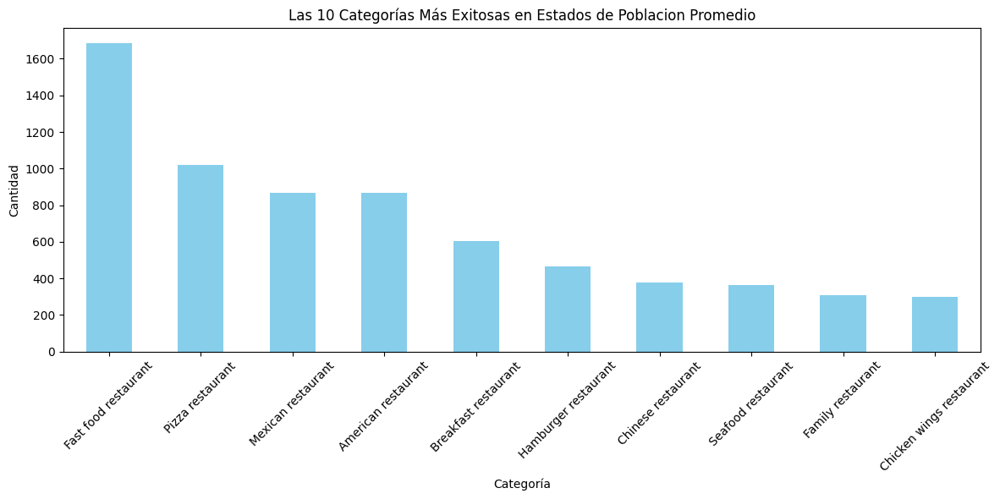

In [110]:

# Calcular las 10 categorías más exitosas
top_10_categorias = Estados_poblacion_intermedia_df['category'].value_counts().nlargest(10)

# Crear la gráfica de barras
plt.figure(figsize=(12, 6))  # Tamaño de la gráfica
top_10_categorias.plot(kind='bar', color='skyblue')
plt.xlabel('Categoría')  # Etiqueta del eje x
plt.ylabel('Cantidad')  # Etiqueta del eje y
plt.title('Las 10 Categorías Más Exitosas en Estados de Poblacion Promedio')  # Título de la gráfica
plt.xticks(rotation=45)  # Rotar las etiquetas del eje x para mayor legibilidad

# Mostrar la gráfica
plt.tight_layout()
plt.show()


# Este gráfico de barras muestra las 10 categorías de restaurantes más exitosas en estados de población promedio de los Estados Unidos. Estas categorías representan los tipos de cocina y restaurantes que disfrutan de una presencia significativa y una demanda considerable en estas áreas demográficas intermedias del país.

### En comparación con los estados más poblados, las categorías de comida rápida, comida mexicana y pizzerías siguen siendo extremadamente populares en los estados de población promedio. Esto indica que la comida rápida y las opciones de comida internacional, como la mexicana e italiana, son igualmente apreciadas en estas áreas intermedias.

### Sin embargo, se observan algunas diferencias notables. En lugar de la categoría "Italian restaurant", que estaba presente en los estados más poblados, ahora vemos una categoría de "Chichen Wings restaurant", lo que sugiere un gusto particular por las alas de pollo en estos estados de población promedio.

### Además, "Hamburguer restaurant" ha desplazado a "Chinese restaurant" en el ranking de categorías exitosas, lo que indica una preferencia por las hamburguesas en lugar de la cocina china en estos estados.

### Es interesante notar que las categorías "Seafood restaurant", "Family restaurant" y "Chichen Wings restaurant" aparecen en los últimos lugares, lo que sugiere que, aunque son menos comunes, todavía tienen un lugar en la escena culinaria de estos estados de población promedio.

### En resumen, el gráfico resalta la similitud en las preferencias alimenticias con los estados más poblados, así como las diferencias específicas en las elecciones culinarias, como el aumento de la popularidad de las alas de pollo y las hamburguesas, y la inclusión de nuevas categorías como "Chichen Wings restaurant" en los estados de población promedio.






# ANALSIS DE FRANQUICIAS EN ESTADOS INTERMEDIOS

In [112]:
# Calcular la frecuencia de cada nombre de restaurante
restaurant_name_counts_inter = Estados_poblacion_intermedia_df['name'].value_counts()

# Filtrar los nombres que aparecen más de una vez (posibles franquicias intermedios)
franquicias_intermedios = restaurant_name_counts_inter[restaurant_name_counts_inter > 1].index.tolist()

# Mostrar las franquicias intermedios
print("Franquicias encontradas:")
for franquicia in franquicias_intermedios:
    print(franquicia)


Franquicias encontradas:
Subway
Taco Bell
Pizza Hut
McDonald's
Little Caesars Pizza
Domino's Pizza
Smoothie King
Sonic Drive-In
Papa John's Pizza
Chick-fil-A
Papa Murphy's | Take 'N' Bake Pizza
Waffle House
Popeyes Louisiana Kitchen
Wendy's
KFC
Church's Chicken
Burger King
Godfather's Pizza
Arby's
QuikTrip
Starbucks
Rally's
Jimmy John's
QDOBA Mexican Eats
Charleys Cheesesteaks
Captain D's
Panda Express
Bojangles' Famous Chicken 'n Biscuits
Long John Silver's
American Deli
A&W Restaurant
Dunkin'
Snappy Tomato Pizza
Jack in the Box
Applebee's Grill + Bar
Jack's
IHOP
TacoTime
Raising Cane's Chicken Fingers
Thorntons
Five Guys
Hardee's
Godfather's Pizza Express
Huddle House
Shari's Cafe and Pies
Whataburger
Marco's Pizza
Olive Garden Italian Restaurant
Chuck E. Cheese
Logan's Roadhouse
Denny's
McAlister's Deli
Papa Murphy's Take 'N' Bake Pizza
Panera Bread
Zaxby's Chicken Fingers & Buffalo Wings
Steak 'n Shake
Johnny's Pizza House
Moe's Southwest Grill
Mazzio's Italian Eatery
Chipotle Mexi

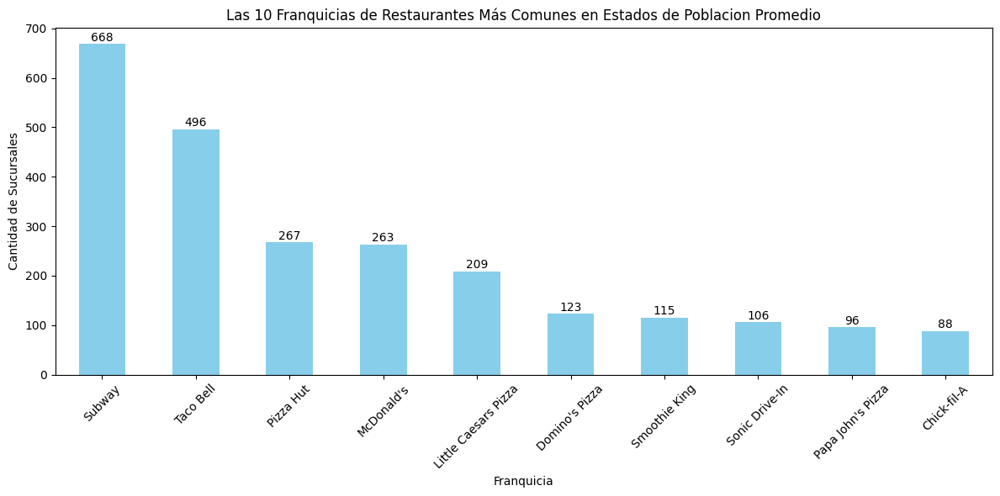

In [113]:
# Calcular la frecuencia de cada nombre de restaurante
restaurant_name_counts_inter = Estados_poblacion_intermedia_df['name'].value_counts()

# Filtrar los nombres que aparecen más de una vez (posibles franquicias)
franquicias = restaurant_name_counts_inter[restaurant_name_counts_inter > 1]

# Limitar a las 10 franquicias más comunes
top_10_franquicias_inter = franquicias.head(10)

# Crear la gráfica de barras
plt.figure(figsize=(12, 6))  # Tamaño de la gráfica
top_10_franquicias_inter.plot(kind='bar', color='skyblue')
plt.xlabel('Franquicia')  # Etiqueta del eje x
plt.ylabel('Cantidad de Sucursales')  # Etiqueta del eje y
plt.title('Las 10 Franquicias de Restaurantes Más Comunes en Estados de Poblacion Promedio')  # Título de la gráfica
plt.xticks(rotation=45)  # Rotar las etiquetas del eje x para mayor legibilidad

# Agregar etiquetas con el número exacto de sucursales en las barras
for i, v in enumerate(top_10_franquicias_inter):
    plt.text(i, v + 1, str(v), ha='center', va='bottom', fontsize=10)

# Mostrar la gráfica
plt.tight_layout()
plt.show()

# Este grafico nos muestra las 10 franquicias de restaurantes más comunes en estados de población promedio de los Estados Unidos. Estos estados se caracterizan por tener un equilibrio demográfico, y las preferencias gastronómicas de la población reflejan una mezcla diversa de opciones culinarias.

### En este análisis, notamos algunas similitudes con los estados más poblados, como el hecho de que Subway continúa siendo la franquicia líder, con un total de 668 sucursales. Taco Bell se mantiene en el segundo lugar con 496 sucursales. Sin embargo, también observamos cambios notables en las clasificaciones y la presencia de algunas franquicias nuevas.

### Pizza Hut ha avanzado al tercer lugar con 267 sucursales, superando a McDonald's, que se encuentra en el cuarto lugar con 263 sucursales. Además, Little Caesars Pizza ocupa el quinto lugar con 209 sucursales, lo que indica una popularidad constante de las pizzerías en estos estados intermedios.

### Entre las franquicias que han ganado terreno en estos estados de población promedio, destaca la presencia de "Smoothie King", que se posiciona en el sexto lugar con 115 sucursales. Smoothie King es conocida por ofrecer una amplia variedad de batidos y bebidas a base de frutas, que son populares entre aquellos que buscan opciones más saludables y refrescantes en su dieta. Su inclusión en el ranking sugiere una creciente conciencia de la importancia de opciones de comida rápida más saludables y nutritivas.

### Otra adición destacada es "Sonic Drive-In", que se encuentra en el séptimo lugar con 106 sucursales. Sonic es famosa por su experiencia de servicio en autos y una amplia gama de opciones, incluyendo hamburguesas, hot dogs, batidos y bebidas con sabores personalizables. Su estilo único de servicio en autos puede haber contribuido a su popularidad en estos estados de población promedio, ofreciendo comodidad y variedad a los clientes.

### Además, "Papa John's Pizza" se posiciona en el octavo lugar con 96 sucursales. Esta franquicia es conocida por sus pizzas de calidad con ingredientes frescos y una variedad de opciones de coberturas. Su presencia en estos estados sugiere que la demanda de opciones de pizza de alta calidad sigue siendo fuerte en la región.

### Finalmente, Chick-fil-A cierra la lista de las 10 franquicias más comunes, ocupando el décimo lugar con 88 sucursales. Cabe destacar que Chick-fil-A también figuraba en el ranking de los estados más poblados, lo que indica su popularidad constante en diferentes áreas demográficas del país.

### Para tener en cuenta este gráfico refleja la diversidad de preferencias culinarias en los estados de población promedio, destacando las franquicias de comida rápida y pizza como las más populares, junto con la introducción de nuevas opciones como Smoothie King y Sonic Drive-In en el mercado de restaurantes de estas áreas, estas nuevas incorporaciones al ranking reflejan la diversificación de opciones culinarias en estados de población promedio. Desde opciones más saludables y nutritivas hasta experiencias de comida rápida únicas, estas franquicias están respondiendo a las preferencias cambiantes de los consumidores y ofreciendo una amplia variedad de elecciones gastronómicas para satisfacer las necesidades de la población local.

# MAPA DE UBICACION DE FRANQUICIAS EN LOS ESTADOS DE POBLACION PROMEDIO DE LOS ESTADOS UNIDOS

In [115]:


# Crear un mapa centrado en una ubicación inicial
mapa_franquicias_inter = folium.Map(location=[37.0902, -95.7129], zoom_start=4)  # Ubicación central de EE. UU. y nivel de zoom inicial

# Diccionario para asignar un color único a cada franquicia
colors = {
    'Subway': 'blue',
    'Taco Bell': 'green',
    "McDonald's": 'red',
    'Wawa': 'purple',
    'Pizza Hut': 'orange',
    'Little Caesars Pizza': 'pink',
    'Dominos Pizza': 'yellow',
    'Smoothie King': 'brown',
    'Sonic Drive-In': 'black',
    "Papa John's Pizza": 'gray',
    'Chick-fil-A': 'violet'
}

# Crear un grupo de marcadores para cada franquicia
groups = {franquicia: folium.FeatureGroup(name=franquicia) for franquicia in colors.keys()}

# Filtrar el DataFrame para obtener las filas de las franquicias especificadas
franquicias_df_inter = Estados_poblacion_intermedia_df[Estados_poblacion_intermedia_df['name'].isin(colors.keys())]

# Agregar marcadores para cada sucursal de franquicia y agregarlos al grupo correspondiente
for index, row in franquicias_df_inter.iterrows():
    franquicia = row['name']  # Obtener el nombre de la franquicia
    color = colors.get(franquicia, 'gray')  # Obtener el color correspondiente o usar gris como predeterminado
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        tooltip=row['name'],  # Mostrar el nombre de la sucursal al hacer clic
        icon=folium.Icon(color=color, icon='fas fa-map-marker-alt fa-2x'),
    ).add_to(groups[franquicia])

    # Agregar el nombre de la franquicia como etiqueta en el marcador
    folium.Marker(
        location=[row['latitude'] + 0.1, row['longitude']],  # Ajusta la posición de la etiqueta
        icon=folium.DivIcon(html=f'<div>{franquicia}</div>'),
    ).add_to(groups[franquicia])

# Agregar los grupos al mapa
for franquicia, group in groups.items():
    group.add_to(mapa_franquicias_inter)

# Agregar control de capas (layers control) para alternar entre franquicias
folium.LayerControl().add_to(mapa_franquicias_inter)

# Crear una leyenda debajo del mapa para mostrar los colores y las franquicias con iconos de FontAwesome
legend_html = """
<div style="position: fixed; bottom: 50px; left: 50px; background-color: white; border: 2px solid gray; padding: 5px; z-index:1000;">
    <h4>Leyenda</h4>
    <p><i class="fas fa-map-marker-alt fa-2x" style="color: blue;"></i> Subway</p>
    <p><i class="fas fa-map-marker-alt fa-2x" style="color: green;"></i> Taco Bell</p>
    <p><i class="fas fa-map-marker-alt fa-2x" style="color: red;"></i> McDonald's</p>
    <p><i class="fas fa-map-marker-alt fa-2x" style="color: purple;"></i> Wawa</p>
    <p><i class="fas fa-map-marker-alt fa-2x" style="color: orange;"></i> Pizza Hut</p>
    <!-- Agrega aquí las entradas para las otras franquicias -->
</div>
"""

# Mostrar la leyenda con iconos de FontAwesome en el Jupyter Notebook
HTML(f'<style>.fas {{ font-size: 2em; }}</style>{legend_html}')

# Mostrar el mapa interactivo
mapa_franquicias_inter

# Guardar el mapa en un archivo HTML
# mapa_franquicias_inter.save('mapa_franquicias_inter.html')


/var/folders/9h/wktndydj5rg6pj7yfx6ws1gm0000gn/T/ipykernel_35065/1273467735.py:35: UserWarning: color argument of Icon should be one of: {'pink', 'lightred', 'darkblue', 'darkgreen', 'green', 'red', 'white', 'orange', 'darkpurple', 'gray', 'purple', 'lightgreen', 'lightgray', 'blue', 'black', 'cadetblue', 'lightblue', 'darkred', 'beige'}.
  icon=folium.Icon(color=color, icon='fas fa-map-marker-alt fa-2x'),


In [118]:
mapa_franquicias_inter

# Este mapa interactivo muestra la ubicación de diversas franquicias populares en estados de población intermedia de los Estados Unidos. Las franquicias representadas en el mapa incluyen:

### Subway (Marcadores en azul): Subway lidera con un total de 668 sucursales en estos estados, lo que lo convierte en la franquicia más extendida en esta categoría.

### Taco Bell (Marcadores en verde): Taco Bell se sitúa en el segundo lugar con 496 sucursales en estados de población intermedia.

### Pizza Hut (Marcadores en naranja): Pizza Hut ocupa el tercer lugar con 267 sucursales y supera a McDonald's en esta categoría.

### McDonald's (Marcadores en rojo): McDonald's se encuentra en el cuarto lugar con 263 sucursales en estos estados.

### Little Caesars Pizza (Marcadores en tono morado): Little Caesars Pizza ocupa el quinto lugar con 209 sucursales en estados de población intermedia.

### Domino's Pizza (Marcadores en otro tono morado): Domino's Pizza sigue a Little Caesars con 123 sucursales en estos estados.

### Smoothie King (Marcadores en otro tono morado): Smoothie King es una sorpresa en esta lista, con 115 sucursales en estados de población intermedia.

### Sonic Drive-In (Marcadores en otro tono morado): Sonic Drive-In es otra franquicia que se ha expandido en estos estados, con 106 sucursales.

### Papa John's Pizza (Marcadores en otro tono morado): Papa John's Pizza también está presente en estados de población intermedia, con 96 sucursales.

### Chick-fil-A (Marcadores en otro tono morado): Chick-fil-A, que también se encontraba en la lista de los estados más populosos, está en el décimo lugar con 88 sucursales en estos estados.

### Este mapa interactivo nos permite explorar la distribución geográfica de estas franquicias en estados de población intermedia y conocer su alcance en diferentes áreas del país. 






# MAPA INTERACTIVO DE SUCURSALES DE SMOOTHIE KING EN 5 ESTADOS DE POBLACION PROMEDIO DE LOS ESTADOS UNIDOS

In [129]:
# Crear un mapa centrado en una ubicación inicial
mapa__Smoothie_King= folium.Map(location=[36.239999999999995, -96.42], zoom_start=6)


# Filtrar el DataFrame para obtener solo las sucursales de Smoothie King
SmoothieKing_df = Estados_poblacion_intermedia_df[Estados_poblacion_intermedia_df['name'] == 'Smoothie King']

# Agregar marcadores para cada sucursal de Smoothie King
for index, row in SmoothieKing_df.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        tooltip=row['name'],  
    ).add_to(mapa__Smoothie_King)

# Mostrar el mapa interactivo de Smoothie King
mapa__Smoothie_King

# Guardar el mapa de calor en un archivo HTML
# mapa__Smoothie_King.save('mapa__Smoothie_King.html')


In [130]:
mapa__Smoothie_King

# Sucursales de Smoothie King en Estados de Población Intermedia

### Este mapa muestra la ubicación de las sucursales de Smoothie King en estados de población intermedia de los Estados Unidos. Smoothie King es una franquicia conocida por sus batidos y opciones saludables. En estos estados intermedios, Smoothie King ofrece a los residentes y visitantes la oportunidad de disfrutar de bebidas deliciosas y nutritivas.

### Características del Mapa:

### Marcadores Individuales: Cada marcador en el mapa representa una sucursal específica de Smoothie King. Al hacer clic en un marcador, puedes obtener información detallada sobre la ubicación, horarios de operación y otras características de la sucursal.

### Este mapa es una herramienta útil para aquellos que deseen localizar y visitar una sucursal de Smoothie King en estados de población intermedia. Si estás en uno de estos estados y buscas una opción refrescante y saludable, este mapa te ayudará a encontrar la sucursal más cercana. Disfruta de una deliciosa bebida mientras te mantienes saludable en tu ubicación elegida.

In [127]:

# Crear un mapa centrado en una ubicación inicial
mapa_calor_smoothie_king = folium.Map(location=[36.239999999999995, -96.42], zoom_start=6)

# Filtrar el DataFrame para obtener solo las sucursales de Smoothie King en estados de población intermedia
smoothie_king_df = Estados_poblacion_intermedia_df[Estados_poblacion_intermedia_df['name'] == 'Smoothie King']

# Obtener las coordenadas de las sucursales de Smoothie King
coordenadas_smoothie_king = smoothie_king_df[['latitude', 'longitude']].values.tolist()

# Crear un mapa de calor con las coordenadas
HeatMap(coordenadas_smoothie_king).add_to(mapa_calor_smoothie_king)

# Mostrar el mapa de calor
mapa_calor_smoothie_king

# Guardar el mapa de calor en un archivo HTML
# mapa_calor_smoothie_king.save('mapa_calor_smoothie_king.html')


In [128]:
mapa_calor_smoothie_king

# El mapa de calor presenta una visualización detallada de la distribución geográfica de las sucursales de Smoothie King en estados de población intermedia de los Estados Unidos, que incluyen Kentucky, Louisiana, Oregon, Oklahoma y Alabama.

### La intensidad de los colores en el mapa de calor refleja la densidad de sucursales en cada área. Las áreas con una mayor concentración de sucursales de Smoothie King se muestran en tonos más intensos, lo que indica una mayor presencia de estas tiendas en esas ubicaciones específicas.

### Este mapa proporciona información valiosa sobre la expansión de Smoothie King en los estados de población intermedia, lo que puede ser útil para tomar decisiones estratégicas en términos de ubicaciones futuras de sucursales o identificar áreas de alta demanda para sus productos y servicios.

In [136]:


# Crear un mapa centrado en una ubicación inicial
mapa_smoothie_king_inter = folium.Map(location=[36.239999999999995, -96.42], zoom_start=6)

# Filtrar el DataFrame para obtener solo las sucursales de Smoothie King 
smoothie_king_df = Estados_poblacion_intermedia_df[Estados_poblacion_intermedia_df['name'] == 'Smoothie King']

# Obtener la cantidad de sucursales de Smoothie King 
cantidad_king_inter = len(smoothie_king_df)

# Definir un color único para todas las sucursales de Smoothie King 
color = 'green'

# Crear un ícono personalizado para representar la cantidad de sucursales
icono_cantidad = folium.DivIcon(html=f'<div>Cantidad de Sucursales: {cantidad_king_inter}</div>')

# Agregar un marcador con el ícono personalizado
folium.Marker(
    location=[36.239999999999995, -96.42],  
    icon=icono_cantidad,
).add_to(mapa_smoothie_king_inter)

# Agregar marcadores para cada sucursal de Smoothie King
for index, row in smoothie_king_df.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        tooltip=f"{row['name']}<br>Latitud: {row['latitude']}<br>Longitud: {row['longitude']}",  
        icon=folium.Icon(color=color),  # Asignar el mismo color a todos los marcadores
    ).add_to(mapa_smoothie_king_inter)

# Mostrar el mapa interactivo de Smoothie King 
mapa_smoothie_king_inter





# Este grafo muestra las ubicaciones de las sucursales de Smoothie King en los estados de población intermedia de los Estados Unidos. 

### Las sucursales se encuentran distribuidas a lo largo de la región, lo que sugiere una presencia establecida de Smoothie King en estos estados. La disposición de las sucursales también puede indicar áreas con una alta demanda de productos de Smoothie King.

### Este mapa no solo muestra la ubicación de las sucursales existentes sino que también ofrece una oportunidad potencial para la apertura de nuevas sucursales. Al identificar áreas que carecen de sucursales cercanas, la franquicia podría considerar la expansión en esas regiones para satisfacer la demanda no cubierta.

### La presencia de múltiples sucursales cercanas podría indicar áreas de alta densidad de población o zonas comerciales activas, lo que podría ser una señal para la empresa de que estas ubicaciones son exitosas.

### Por ultimo, este mapa proporciona una visión general de la distribución geográfica de las sucursales de Smoothie King en los estados de población intermedia, destacando tanto las ubicaciones actuales como las posibles oportunidades de crecimiento.

# ANALISIS POR CONGLOMERADOS DE ESTADOS DE MENOR POBLACION

In [137]:
# Calcular la cantidad de veces que aparece cada categoría
cantidad_cate_estados_menor = estados_menos_poblacion['category'].value_counts()

# Encontrar la categoría con la mayor cantidad
most_common_category_stat_menor = cantidad_cate_estados_menor.idxmax()

# Filtrar el DataFrame original en función de la categoría con la mayor cantidad
most_common_category_stat_menor = estados_menos_poblacion[estados_menos_poblacion['category'] == most_common_category_stat_menor]

# Mostrar el DataFrame resultante
most_common_category_stat_menor

,Unnamed: 0,gmap_id,Estado,category,avg_rating,name,latitude,longitude
18375,18787,0x57abb0cfc31c0d15:0xb167f2687bc999cc,Alaska,Fast food restaurant,4.5,Dutch Harbor Restaurant,53.882991,-166.552444
18402,18814,0x56c67b8b17d34cdf:0x8095fe0f2040c344,Alaska,Fast food restaurant,3.5,Samurai Sam's,60.559904,-151.237877
18603,19015,0x540c267784541373:0x4f82960d41008f5b,Alaska,Fast food restaurant,3.5,Subway,55.375526,-131.720538
18622,19034,0x51325bc1aac6c707:0xb64bc2930aea463,Alaska,Fast food restaurant,4.2,Arby's,64.835291,-147.811680
18682,19094,0x56c8998365b6be7d:0x259a4355d76b243e,Alaska,Fast food restaurant,3.5,Pizza Hut,61.103706,-149.858633
...,...,...,...,...,...,...,...,...
807516,1023223,0x4cb5a7f5e31d07df:0x5ae41fb42ad0d035,Vermont,Fast food restaurant,3.9,Dunkin',44.255776,-72.576057
807521,1023228,0x4cca7762ea62b837:0x842a2d78271b6c4e,Vermont,Fast food restaurant,3.5,McDonald's,44.494921,-73.122338
807536,1023243,0x89e0237a2396cc05:0x9004a7b30fa8321,Vermont,Fast food restaurant,3.6,Dunkin',43.604017,-73.003287
807546,1023253,0x89e01a730d7d4a75:0x9f08d0f0ecb5ba73,Vermont,Fast food restaurant,3.5,Dunkin',43.608710,-73.207958


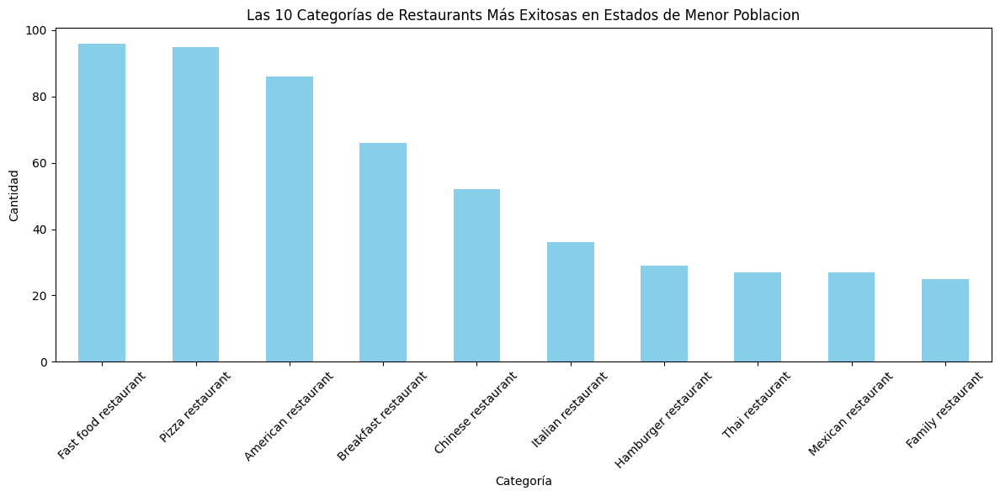

In [139]:
# Calcular las 10 categorías más exitosas 
top_10_categorias_menor = estados_menos_poblacion['category'].value_counts().nlargest(10)

# Crear la gráfica de barras
plt.figure(figsize=(12, 6))  # Tamaño de la gráfica
top_10_categorias_menor.plot(kind='bar', color='skyblue')
plt.xlabel('Categoría')  # Etiqueta del eje x
plt.ylabel('Cantidad')  # Etiqueta del eje y
plt.title('Las 10 Categorías de Restaurants Más Exitosas en Estados de Menor Poblacion')  # Título de la gráfica
plt.xticks(rotation=45)  # Rotar las etiquetas del eje x para mayor legibilidad

# Mostrar la gráfica
plt.tight_layout()
plt.show()

# El gráfico muestra las categorías de restaurantes más exitosas en estados con poblaciones más reducidas en los Estados Unidos. 

### A pesar de las diferencias demográficas, se observa una tendencia similar a la de los estados más poblados, donde las categorías de restaurantes de comida rápida, como "Fast Food," siguen ocupando el primer lugar en popularidad. Además, "Pizza restaurant" y "American restaurant" también mantienen su posición en la parte superior de la lista de categorías exitosas.

### Sin embargo, es importante destacar la inclusión de la categoría "Thai restaurant," que no estaba presente en los estados más poblados ni en los de población intermedia. Esto sugiere una posible adaptación de las preferencias culinarias en estados con poblaciones más pequeñas y una mayor diversidad de opciones gastronómicas. Los restaurantes de comida tailandesa, comúnmente conocidos como 'Thai restaurants,' se especializan en la cocina de Tailandia, que es apreciada por su combinación única de sabores y aromas. La comida tailandesa se caracteriza por su equilibrio entre lo dulce, lo salado, lo picante y lo ácido, lo que la hace extremadamente sabrosa y variada

### Por otro lado, la categoría "Mexican restaurant" se encuentra en el último lugar de las categorías más exitosas en estos estados, lo que indica una menor prevalencia de este tipo de establecimientos en comparación con otros lugares. Además, es interesante notar que "Seafood restaurant" no aparece en la lista, lo que podría reflejar una menor demanda o presencia de restaurantes de mariscos en estos estados.

### El gráfico resalta la persistencia de las categorías de restaurantes de comida rápida y estadounidense como las más populares en estados con poblaciones más pequeñas. También destaca la introducción de la categoría "Thai restaurant" y la posición menos prominente de "Mexican restaurant," ofreciendo información valiosa sobre las preferencias culinarias y las oportunidades de negocio en estos estados.

# ANALISIS DE FRANQUICIAS EN ESTADOS DE MENOR POBLACION

In [140]:
# Calcular la frecuencia de cada nombre de restaurante
restaurant_name_counts_menor = estados_menos_poblacion['name'].value_counts()

# Filtrar los nombres que aparecen más de una vez (posibles franquicias intermedios)
franquicias_menor = restaurant_name_counts_menor[restaurant_name_counts_menor > 1].index.tolist()

# Mostrar las franquicias intermedios
print("Franquicias encontradas:")
for franquicia in franquicias_menor:
    print(franquicia)


Franquicias encontradas:
Subway
Papa Murphy's | Take 'N' Bake Pizza
Dunkin'
McDonald's
Pizza Hut
Domino's Pizza
Holiday Stationstores
Taco Bell
Eco Bean And Greens
Tomgirl Kitchen
The Junction Restaurant
A&W Restaurant
TacoTime
Charleys Cheesesteaks
Samurai Sam's
Phnom Penh Sandwich Station
Bernie's Restaurant
Sicily's Pizza Wasilla
Campobello Bistro
Winky's Wings
Park Side Grill
Saigon Kitchen
KFC
Franklins
AJ's Gourmet Burgers
Chipotle Mexican Grill
Little Caesars Pizza
Greenfield's
Shin-La Restaurant & Sushi Bar
QDOBA Mexican Eats
New Red Panda LLC
Asian Gourmet
Nim's House of Thai Food
Fusion Grill
Dunkin
Sukho Thai Restaurant
Sam's Taste of Thai
Sunday's Caribbean Cuisine
Waffles and Whatnot (Betsy)
Hungry Bear Pub & Grill
Alaska Taste of Thai
The Bradley House Food & Spirits
Bethel Airport Restaurant (B.A.R)
Positive Pie
Sandwich Deck Restaurant
Gaku Ramen
Go Wild Juicery
Eastern Dragon
Tulip Bar and Restaurant
Burger's Wings & Things
Bearded Frog
Phở Saigon
Friendly's
Pearl Stre

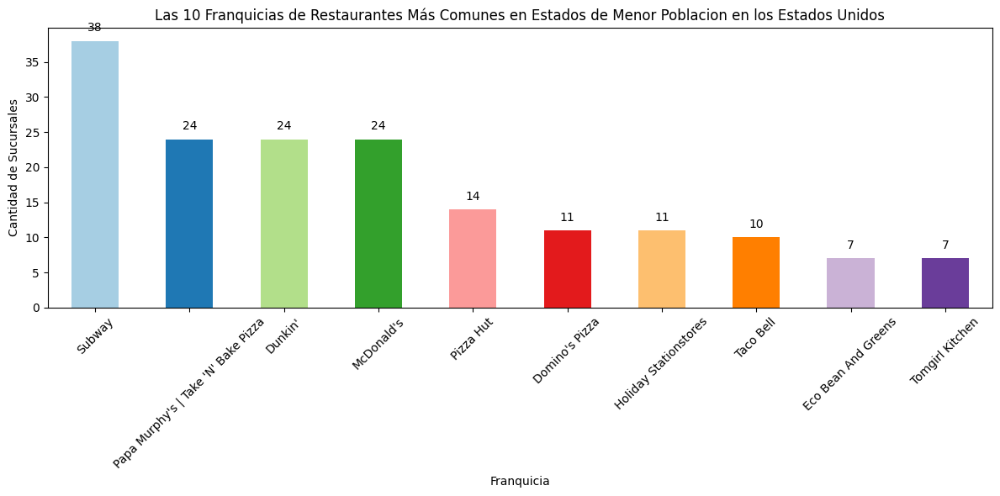

In [142]:
# Calcular la frecuencia de cada nombre de restaurante
restaurant_name_counts_menor = estados_menos_poblacion['name'].value_counts()

# Filtrar los nombres que aparecen más de una vez (posibles franquicias)
franquicias = restaurant_name_counts_menor[restaurant_name_counts_menor > 1]

# Limitar a las 10 franquicias más comunes
top_10_franquicias_menor = franquicias.head(10)

# Crear la gráfica de barras
plt.figure(figsize=(12, 6))

# Crear la gráfica de barras con colores atractivos
colors = plt.cm.Paired(range(len(top_10_franquicias_menor)))
top_10_franquicias_menor.plot(kind='bar', color=colors)

plt.xlabel('Franquicia')  # Etiqueta del eje x
plt.ylabel('Cantidad de Sucursales')  # Etiqueta del eje y
plt.title('Las 10 Franquicias de Restaurantes Más Comunes en Estados de Menor Poblacion en los Estados Unidos')
plt.xticks(rotation=45)  # Rotar las etiquetas del eje x para mayor legibilidad

# Agregar etiquetas con el número exacto de sucursales en las barras
for i, v in enumerate(top_10_franquicias_menor):
    plt.text(i, v + 1, str(v), ha='center', va='bottom', fontsize=10)

# Mostrar la gráfica
plt.tight_layout()
plt.show()


# 10 franquicias de restaurantes más comunes en estados de menor población en los Estados Unidos. 

### En contraste con los estados más poblados o de población promedio, estos estados muestran algunas diferencias interesantes en las preferencias de restaurantes y la presencia de ciertas franquicias.

### En primer lugar, "Subway" continúa liderando la lista con un total de 38 sucursales en estos estados, lo que indica su popularidad en áreas menos densamente pobladas.

### Un punto destacado es la aparición de "Papa Murphy's | Take 'N' Bake Pizza" en el segundo lugar, con 24 sucursales. Esta franquicia no estaba presente en estados más poblados o de población promedio, lo que sugiere una posible adaptación a las preferencias locales en áreas menos densamente pobladas.

### Otra observación interesante es que "Dunkin'," "McDonald's," y "Pizza Hut" ocupan el tercer lugar con 24 sucursales cada uno. Esto muestra que estas franquicias siguen siendo populares en todo tipo de áreas, independientemente de la densidad de población.

### "Domino's Pizza" y "Holiday Stationstores" están empatados en el cuarto lugar, ambas con 11 sucursales. "Holiday Stationstores" no aparecía en los estados más poblados ni en los de población promedio, lo que sugiere una presencia más regional.

### "Taco Bell" ocupa el quinto lugar con 10 sucursales, una posición diferente en comparación con los estados más poblados, donde solía estar en el segundo lugar.

### El gráfico también muestra la entrada de dos nuevas franquicias: "Eco Bean And Greens" y "Tomgirl Kitchen," ambas con 7 sucursales. Estas franquicias parecen estar aprovechando oportunidades de mercado en estos estados de menor población.

### Para finalizar, este gráfico proporciona una visión interesante de las franquicias de restaurantes más comunes en áreas con menor densidad de población, destacando tanto la persistencia de algunas marcas populares como la introducción de opciones gastronómicas regionales y nuevas franquicias en estos mercados.

# MAPA DE UBICACION DE FRANQUICIAS EN LOS ESTADOS DE MENOR POBLACION  DE LOS ESTADOS UNIDOS

In [143]:
# Crear un mapa centrado en una ubicación inicial
mapa_franquicias_menor = folium.Map(location=[39.833851, -98.585330], zoom_start=4)  # Ubicación central de los estados mencionados y nivel de zoom inicial

# Diccionario para asignar un color único a cada franquicia
colors = {
    'Subway': 'blue',
    'Papa Murphy\'s | Take \'N\' Bake Pizza': 'green',
    "Dunkin'": 'red',
    'McDonald\'s': 'purple',
    'Pizza Hut': 'orange',
    'Dominos Pizza': 'pink',
    'Holiday Stationstores': 'yellow',
    'Taco Bell': 'brown',
    'Eco Bean And Greens': 'black',
    'Tomgirl Kitchen': 'gray'
}

# Crear un grupo de marcadores para cada franquicia
groups = {franquicia: folium.FeatureGroup(name=franquicia) for franquicia in colors.keys()}

# Filtrar el DataFrame para obtener las filas de las franquicias especificadas
franquicias_df_menor = estados_menos_poblacion[estados_menos_poblacion['name'].isin(colors.keys())]

# Agregar marcadores para cada sucursal de franquicia y agregarlos al grupo correspondiente
for index, row in franquicias_df_menor.iterrows():
    franquicia = row['name']  # Obtener el nombre de la franquicia
    color = colors.get(franquicia, 'gray')  # Obtener el color correspondiente o usar gris como predeterminado
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        tooltip=row['name'],  # Mostrar el nombre de la sucursal al hacer clic
        icon=folium.Icon(color=color, icon='fas fa-map-marker-alt fa-2x'),
    ).add_to(groups[franquicia])

    # Agregar el nombre de la franquicia como etiqueta en el marcador
    folium.Marker(
        location=[row['latitude'] + 0.1, row['longitude']],  # Ajusta la posición de la etiqueta
        icon=folium.DivIcon(html=f'<div>{franquicia}</div>'),
    ).add_to(groups[franquicia])

# Agregar los grupos al mapa
for franquicia, group in groups.items():
    group.add_to(mapa_franquicias_menor)

# Agregar control de capas (layers control) para alternar entre franquicias
folium.LayerControl().add_to(mapa_franquicias_menor)

# Crear una leyenda debajo del mapa para mostrar los colores y las franquicias con iconos de FontAwesome
legend_html = """
<div style="position: fixed; bottom: 50px; left: 50px; background-color: white; border: 2px solid gray; padding: 5px; z-index:1000;">
    <h4>Leyenda</h4>
    <p><i class="fas fa-map-marker-alt fa-2x" style="color: blue;"></i> Subway</p>
    <p><i class="fas fa-map-marker-alt fa-2x" style="color: green;"></i> Papa Murphy's | Take 'N' Bake Pizza</p>
    <p><i class="fas fa-map-marker-alt fa-2x" style="color: red;"></i> Dunkin'</p>
    <p><i class="fas fa-map-marker-alt fa-2x" style="color: purple;"></i> McDonald's</p>
    <p><i class="fas fa-map-marker-alt fa-2x" style="color: orange;"></i> Pizza Hut</p>
    <p><i class="fas fa-map-marker-alt fa-2x" style="color: pink;"></i> Dominos Pizza</p>
    <p><i class="fas fa-map-marker-alt fa-2x" style="color: yellow;"></i> Holiday Stationstores</p>
    <p><i class="fas fa-map-marker-alt fa-2x" style="color: brown;"></i> Taco Bell</p>
    <p><i class="fas fa-map-marker-alt fa-2x" style="color: black;"></i> Eco Bean And Greens</p>
    <p><i class="fas fa-map-marker-alt fa-2x" style="color: gray;"></i> Tomgirl Kitchen</p>
</div>
"""

# Mostrar la leyenda con iconos de FontAwesome en el Jupyter Notebook
HTML(f'<style>.fas {{ font-size: 2em; }}</style>{legend_html}')

# Mostrar el mapa interactivo
mapa_franquicias_menor

# Guardar el mapa en un archivo HTML
# mapa_franquicias_menor.save('mapa_franquicias_menor.html')


/var/folders/9h/wktndydj5rg6pj7yfx6ws1gm0000gn/T/ipykernel_35065/1729008856.py:31: UserWarning: color argument of Icon should be one of: {'pink', 'lightred', 'darkblue', 'darkgreen', 'green', 'red', 'white', 'orange', 'darkpurple', 'gray', 'purple', 'lightgreen', 'lightgray', 'blue', 'black', 'cadetblue', 'lightblue', 'darkred', 'beige'}.
  icon=folium.Icon(color=color, icon='fas fa-map-marker-alt fa-2x'),


In [144]:
mapa_franquicias_menor

# Este mapa interactivo nos brinda una visión detallada de la distribución geográfica de varias franquicias de restaurantes en estados estadounidenses con poblaciones más reducidas, que incluyen Wyoming, Vermont, District of Columbia, Alaska y North Dakota. Cada franquicia se representa mediante un marcador de ubicación distintivo en el mapa, y estos marcadores están codificados por colores para facilitar la identificación de cada franquicia.

### Lo que resalta de este mapa es que, a pesar de tratarse de estados con poblaciones más pequeñas en comparación con las áreas urbanas más densamente pobladas, algunas franquicias de comida rápida mantienen una fuerte presencia. En primer lugar, "Subway" continúa liderando con un total de 38 sucursales en estos estados. Le sigue "Papa Murphy's | Take 'N' Bake Pizza," una franquicia de pizzas con 24 sucursales, que no estaba presente en los estados más poblados ni en los de población intermedia, lo que sugiere una adaptación a las preferencias culinarias en estos lugares.

### Además, observamos que "Dunkin'," "McDonald's," "Pizza Hut," "Dominos Pizza" y "Holiday Stationstores" tienen una presencia significativa en estos estados, con 24, 24, 14, 11 y 11 sucursales, respectivamente. Es interesante notar que "Sonic Drive-In," "Eco Bean And Greens" y "Tomgirl Kitchen" son franquicias relativamente nuevas en estos estados, cada una con 7 sucursales, lo que podría indicar oportunidades de crecimiento y expansión en áreas con menor densidad de población.

### Este mapa no solo ofrece información sobre la ubicación de las sucursales de estas franquicias, sino que también brinda pistas sobre las preferencias culinarias y las oportunidades de negocio en estados menos poblados de los Estados Unidos.

# MAPA INTERACTIVO DE SUCURSALES DE PAPA MURPHY\'S | TAKE 'N'BAKE PIZZA EN ESTADOS DE MENOR POBLACION  DE LOS ESTADOS UNIDOS

### "Papa Murphy's | Take 'N' Bake Pizza" es una cadena de restaurantes de pizza que se especializa en pizzas preparadas para llevar y hornear en casa. La característica distintiva de Papa Murphy's es que no hornea las pizzas en el restaurante; en su lugar, los clientes compran pizzas frescas y sin hornear que luego pueden cocinar en sus propios hornos en casa.

### Los clientes de Papa Murphy's pueden personalizar sus pizzas eligiendo entre una variedad de ingredientes y coberturas, y luego se les entrega la pizza sin hornear en una bandeja para hornear, lista para cocinar. Esto permite a los clientes disfrutar de pizzas recién horneadas en la comodidad de sus hogares y controlar el tiempo de cocción según sus preferencias.

### La cadena se enorgullece de utilizar ingredientes frescos y de alta calidad en sus pizzas y ofrece una variedad de opciones de menú, que incluyen pizzas tradicionales, pizzas gourmet, pizzas vegetarianas y opciones sin gluten. Papa Murphy's se ha convertido en una opción popular para aquellos que buscan una experiencia de pizza personalizada y fresca en casa.

In [149]:
# Crear un mapa centrado en una ubicación inicial
mapa_papa = folium.Map(location=[39.833851, -98.585330], zoom_start=4)  

# Filtrar el DataFrame para obtener solo las sucursales de Papa Murphy\'s | Take \'N\' Bake Pizza
papa_df = estados_menos_poblacion[estados_menos_poblacion['name'] == 'Papa Murphy\'s | Take \'N\' Bake Pizza']

# Agregar marcadores para cada sucursal de Papa Murphy\'s | Take \'N\' Bake Pizza
for index, row in papa_df.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        tooltip=row['name'],  
    ).add_to(mapa_papa)

# Mostrar el mapa interactivo de Papa Murphy\'s | Take \'N\' Bake Pizza
mapa_papa

# Guardar el mapa de calor en un archivo HTML
# mapa_papa.save('mapa_papa.html')

In [150]:
mapa_papa


# Este mapa interactivo nos muestra la ubicación de las sucursales de "Papa Murphy's | Take 'N' Bake Pizza" en varias áreas de menor poblacion de los Estados Unidos. 

### Las sucursales se distribuyen en estados con poblaciones menores, lo que nos ofrece una visión geográfica de la presencia de esta franquicia en las áreas menos densamente pobladas en comparación con las grandes ciudades.

### La distribución de estas sucursales puede revelar información valiosa sobre la estrategia de expansión de la franquicia y las áreas geográficas que han sido identificadas como mercados potenciales. Además, la ubicación geográfica de las sucursales también puede relacionarse con las preferencias culinarias de las comunidades locales, ya que la elección de establecer una franquicia en un lugar específico suele basarse en la demanda del mercado y las oportunidades de negocio.

### Este mapa nos brinda una representación visual de cómo "Papa Murphy's | Take 'N' Bake Pizza" se ha expandido en áreas de menor poblacion en los Estados Unidos, lo que puede servir como una referencia útil para la planificación de futuras sucursales y el entendimiento de las dinámicas de mercado en estas regiones.

In [160]:
# Seleccionar las filas donde el nombre de la franquicia es "Papa Murphy's | Take 'N' Bake Pizza"
papa_murphys_df = estados_menos_poblacion[estados_menos_poblacion['name'] == "Papa Murphy's | Take 'N' Bake Pizza"]

# Luego, seleccionar las columnas 'Estado', 'latitude', 'longitude' y 'name'
papa_murphys_df = papa_murphys_df[['Estado', 'latitude', 'longitude', 'name']]
papa_murphys_df


,Estado,latitude,longitude,name
18546,Alaska,61.110654,-149.854402,Papa Murphy's | Take 'N' Bake Pizza
18546,Alaska,61.110654,-149.854402,Papa Murphy's | Take 'N' Bake Pizza
18546,Alaska,61.110654,-149.854402,Papa Murphy's | Take 'N' Bake Pizza
18546,Alaska,61.110654,-149.854402,Papa Murphy's | Take 'N' Bake Pizza
19258,Alaska,61.340696,-149.556007,Papa Murphy's | Take 'N' Bake Pizza
19258,Alaska,61.340696,-149.556007,Papa Murphy's | Take 'N' Bake Pizza
19258,Alaska,61.340696,-149.556007,Papa Murphy's | Take 'N' Bake Pizza
19258,Alaska,61.340696,-149.556007,Papa Murphy's | Take 'N' Bake Pizza
20528,Alaska,61.579018,-149.408448,Papa Murphy's | Take 'N' Bake Pizza
20528,Alaska,61.579018,-149.408448,Papa Murphy's | Take 'N' Bake Pizza


In [151]:
# Crear un mapa centrado en una ubicación inicial
mapa_calor_papa = folium.Map(location=[39.833851, -98.585330], zoom_start=4)

# Filtrar el DataFrame para obtener solo las sucursales de Papa Murphy's | Take 'N' Bake Pizza
papa_df = estados_menos_poblacion[estados_menos_poblacion['name'] == 'Papa Murphy\'s | Take \'N\' Bake Pizza']

# Obtener las coordenadas de las sucursales de Papa Murphy's | Take 'N' Bake Pizza
coordenadas_papa = papa_df[['latitude', 'longitude']].values.tolist()

# Crear un mapa de calor con las coordenadas
HeatMap(coordenadas_papa).add_to(mapa_calor_papa)

# Mostrar el mapa de calor interactivo
mapa_calor_papa

# Guardar el mapa de calor en un archivo HTML
mapa_calor_papa.save('mapa_calor_papa.html')

In [152]:
mapa_calor_papa

### Este mapa de calor resalta las áreas donde las sucursales de "Papa Murphy's | Take 'N' Bake Pizza" están más densamente concentradas en los estados de población intermedia. Las áreas con colores más intensos indican una mayor densidad de sucursales, mientras que las áreas con colores más claros representan una menor densidad. Esto proporciona una representación visual de dónde se encuentran ubicadas las sucursales con mayor proximidad y, por lo tanto, dónde la franquicia puede tener una presencia más sólida en estos estados.

In [161]:
# Crear un mapa centrado en una ubicación inicial
mapa_papa_murphy = folium.Map(location=[39.833851, -98.585330], zoom_start=4)


# Filtrar el DataFrame para obtener solo las sucursales de Papa Murphy's | Take 'N' Bake Pizza
papa_df = estados_menos_poblacion[estados_menos_poblacion['name'] == "Papa Murphy's | Take 'N' Bake Pizza"]

# Obtener la cantidad de sucursales de Papa Murphy's | Take 'N' Bake Pizza
cantidad_papa_menor = len(papa_df)

# Definir un color único para todas las sucursales de Papa Murphy's | Take 'N' Bake Pizza
color = 'blue'

# Crear un ícono personalizado para representar la cantidad de sucursales
icono_cantidad = folium.DivIcon(html=f'<div>Cantidad de Sucursales: {cantidad_papa_menor}</div>')

# Agregar un marcador con el ícono personalizado
folium.Marker(
    location=[36.239999999999995, -96.42],  
    icon=icono_cantidad,
).add_to(mapa_papa_murphy)

# Agregar marcadores para cada sucursal de Papa Murphy's | Take 'N' Bake Pizza
for index, row in papa_df.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        tooltip=f"{row['name']}<br>Latitud: {row['latitude']}<br>Longitud: {row['longitude']}",  
        icon=folium.Icon(color=color),  # Asignar el mismo color a todos los marcadores
    ).add_to(mapa_papa_murphy)

# Mostrar el mapa interactivo de Papa Murphy's | Take 'N' Bake Pizza
mapa_papa_murphy

# Guardar el mapa de calor en un archivo HTML
# mapa_papa_murphy.save('mapa_papa_murphy.html')

In [162]:
mapa_papa_murphy

# El mapa muestra la ubicación de las sucursales de 'Papa Murphy's | Take 'N' Bake Pizza' en los Estados Unidos, especificamente en Alaska. 

### Todas sus sucursales están distribuidas en Alaska, y el mapa resalta su presencia en diferentes ubicaciones geográficas.

### Cada marcador en el mapa representa una sucursal individual, y al hacer clic en ellos, se puede obtener información adicional, como las coordenadas de latitud y longitud. Además, en la parte superior del mapa, se muestra un marcador especial que indica la cantidad total de sucursales de 'Papa Murphy's | Take 'N' Bake Pizza' en las ubicaciones del Estado de Alaska.

### Esta visualización geográfica brinda una visión general de la distribución geográfica de la franquicia y puede ser útil para identificar patrones de ubicación o oportunidades de expansión en áreas específicas.

# Oportunidades de Inversión en la Industria de Franquicias de Restaurantes en Estados Unidos


### La industria de franquicias de restaurantes en los Estados Unidos es un sector dinámico y en constante evolución. A medida que los gustos y preferencias culinarias cambian, surgen nuevas oportunidades para la inversión y la expansión. En este informe, analizaremos detenidamente los datos relacionados con franquicias de restaurantes en tres categorías de estados: los más densamente poblados, los de población intermedia y los de menor población. Nuestro objetivo es proporcionar una visión integral de las tendencias y oportunidades en cada categoría y ofrecer recomendaciones estratégicas para la inversión en este sector en constante crecimiento.

### I. Análisis de Estados Más Densamente Poblados

### En los estados más densamente poblados de EE. UU., observamos tendencias notables en las preferencias culinarias y la presencia de franquicias. Algunos hallazgos clave incluyen:

#### Dominio de Franquicias Reconocidas: En estados como California, Texas y Nueva York, las franquicias ampliamente reconocidas, como "Subway," "McDonald's" y "Pizza Hut," dominan el mercado. Esto indica una sólida presencia de marcas consolidadas y la fidelidad de los clientes hacia ellas.

### Comida Rápida en la Cima: La categoría de restaurantes de comida rápida, representada por franquicias como "Fast Food," se mantiene en la cima de las preferencias en estos estados densamente poblados. Esta es una oportunidad clave para la inversión en sucursales de comida rápida bien ubicadas.

### Crecimiento de Opciones Étnicas: También hemos observado un crecimiento constante de opciones gastronómicas étnicas, como restaurantes de comida tailandesa, que reflejan la diversidad cultural de estos estados.


### Recomendaciones para Inversión en Estados Más Densamente Poblados:

### Considerar la inversión en ubicaciones estratégicas de franquicias de comida rápida, con un enfoque en mejorar la eficiencia operativa y la calidad del servicio. Explorar la diversificación de opciones de menú para atraer a una base de clientes diversa y en constante cambio. Monitorear las tendencias emergentes en gastronomía étnica y evaluar oportunidades para franquicias especializadas.

### II. Análisis de Estados de Población Intermedia

### En los estados de población intermedia, identificamos patrones únicos de consumo y una oportunidad para la diversificación del mercado. Los resultados clave incluyen:

### Adaptación a las Preferencias Locales: A diferencia de los estados densamente poblados, estos estados muestran una mayor adaptación a las preferencias culinarias locales, con la introducción de franquicias como "Smoothie King" y "Papa Murphy's | Take 'N' Bake Pizza."

### Categorías de Comida Rápida en Crecimiento: Las categorías de comida rápida, como "Smoothie King," demuestran un crecimiento significativo y pueden representar oportunidades de inversión prometedoras.

### Exploración de Nuevos Mercados: La presencia limitada de algunas franquicias en estos estados ofrece espacio para la expansión y el desarrollo de nuevos mercados.
### Recomendaciones para Inversión en Estados de Población Intermedia:

### Evaluar la demanda local y la viabilidad de introducir franquicias emergentes, como "Smoothie King" y "Papa Murphy's | Take 'N' Bake Pizza," en ubicaciones estratégicas.
### Considerar estrategias de marketing localizado para aumentar la conciencia de marca y atraer a la clientela local.
#### Establecer relaciones sólidas con franquiciados locales que comprendan las dinámicas de mercado únicas de cada estado.

### III. Análisis de Estados de Menor Población

### Los estados de menor población presentan oportunidades y desafíos únicos para la inversión en franquicias de restaurantes. Los principales hallazgos son los siguientes:

### Diversidad Gastronómica: Estos estados muestran una diversidad gastronómica significativa, con una mayor variedad de preferencias culinarias en comparación con los estados densamente poblados.

### Oportunidades Emergentes: Hemos identificado la aparición de franquicias menos comunes, como "Papa Murphy's | Take 'N' Bake Pizza," que puede tener potencial de crecimiento en mercados menos saturados.

### Desafíos Competitivos: A pesar de las oportunidades, estos estados también enfrentan desafíos competitivos debido a la presencia de franquicias exitosas y la demanda fluctuante de ciertos tipos de restaurantes.

### Recomendaciones para Inversión en Estados de Menor Población:

### Realizar un análisis de mercado detallado en estados específicos, identificando las preferencias culinarias locales y las franquicias ausentes o subrepresentadas en la región.

### Seleccionar cuidadosamente las franquicias que se adapten a las preferencias culinarias y la cultura local de cada estado.

### Desarrollar una estrategia de expansión sólida que incluya la ubicación estratégica de nuevas sucursales y la adaptación a las condiciones locales.


# Conclusiones Finales

### La industria de franquicias de restaurantes en los Estados Unidos ofrece una serie de oportunidades de inversión en función de la población y las preferencias culinarias en diferentes estados. La adaptación estratégica a las necesidades locales y la elección de franquicias adecuadas son clave para el éxito. Además, la colaboración con franquiciados locales que comprendan el mercado y la comunidad es esencial para una expansión exitosa.

### Para cerrar este análisis de datos proporciona información valiosa para tomar decisiones informadas sobre la inversión en franquicias de restaurantes en los Estados Unidos. Cada categoría de estados presenta oportunidades únicas, y la diversidad gastronómica en el país ofrece una amplia gama de posibilidades para inversores y empresarios. La inversión estratégica y la adaptación a las dinámicas locales son fundamentales para aprovechar estas oportunidades y lograr el éxito en la competitiva industria de la restauración en franquicia.